# Import Modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import time
import h5py
from scipy.stats import norm
import torch
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torch import nn, optim
import scipy.io as sio
import torch.nn.functional as F
# import pandas as pd
import datetime
import os
# import readligo as rl
# from gwpy.timeseries import TimeSeries
import math
import random

import copy

In [2]:
epochs = 50
rTrain = 0.7;
rTest = 0.2;
rValidation = 0.1
# input_vector_length = 100
batch_size = 32
num_bins = 40
coef_delta = 0

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = ""

# Test training

## AE structure

In [3]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(101, 20),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(20, 101),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

## Data preparation

In [13]:
renorm_factor = 20;

realbkg = np.load("../data/Datasets/background.npz")['data'][:, 0] / renorm_factor;
realbbh = np.load("../data/Datasets/bbh_for_challenge.npy")[:, 0]  / renorm_factor;
realsg = np.load("../data/Datasets/sglf_for_challenge.npy")[:, 0] / renorm_factor;
# realglitch = np.load("../data/real_glitches_snrlt5_60132_4000Hz_25ms.npz")["strain_time_data"]

bkg_fft = abs(np.fft.rfft(realbkg))
bkg_fft = bkg_fft/np.linalg.norm([bkg_fft], axis=2).T
bbh_fft = abs(np.fft.rfft(realbbh))
bbh_fft = bkg_fft/np.linalg.norm([bbh_fft], axis=2).T
sg_fft = abs(np.fft.rfft(realsg))
sg_fft = bkg_fft/np.linalg.norm([sg_fft], axis=2).T

/home/sida/miniconda3/lib/python3.11/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/sida/miniconda3/lib/python3.11/site-packages/torch/cuda/__init__.py:749: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 10000). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() if nvml_count < 0 else nvml_count
/tmp/ipykernel_25164/822222561.py:62: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(

Epoch: 0001, Training loss=0.009637, Validation loss=0.009518
Time for this epoch: 2.6162633895874023
Epoch: 0002, Training loss=0.002640, Validation loss=0.002701
Time for this epoch: 2.6476988792419434
Epoch: 0003, Training loss=0.002330, Validation loss=0.002234
Time for this epoch: 2.666247606277466
Epoch: 0004, Training loss=0.002131, Validation loss=0.002142
Time for this epoch: 2.670827865600586
Epoch: 0005, Training loss=0.002090, Validation loss=0.002116
Time for this epoch: 2.6767075061798096
Epoch: 0006, Training loss=0.002150, Validation loss=0.002097
Time for this epoch: 2.6738619804382324
Epoch: 0007, Training loss=0.002154, Validation loss=0.002074
Time for this epoch: 2.675849199295044
Epoch: 0008, Training loss=0.001986, Validation loss=0.002052
Time for this epoch: 2.6685914993286133
Epoch: 0009, Training loss=0.002071, Validation loss=0.002029
Time for this epoch: 2.6729490756988525
Epoch: 0010, Training loss=0.001934, Validation loss=0.002006
Time for this epoch: 2.

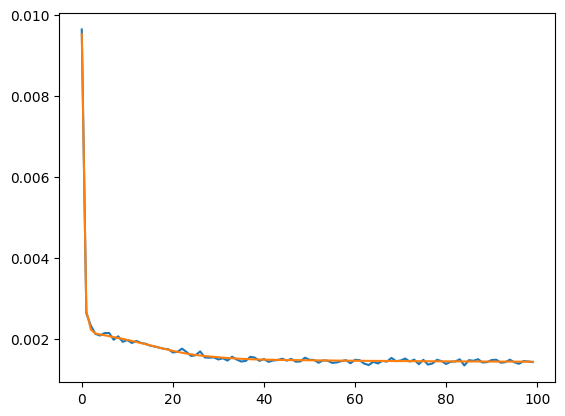

In [16]:
dataset = bkg_fft
nTotal = len(dataset);
nTrain = int(rTrain * nTotal)
nTest = int(rTest * nTotal)

X_train = dataset[:nTrain]
X_test = dataset[-nTest:]
X_validation = dataset[nTrain:-nTest]

trainData = torch.FloatTensor(X_train)
testData = torch.FloatTensor(X_test)
validationData = torch.FloatTensor(X_validation)

train_dataset = TensorDataset(trainData, trainData)
test_dataset = TensorDataset(testData, testData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True, drop_last=True)

autoencoder = AutoEncoder().cpu()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cpu()
loss_train = np.zeros(epochs)
loss_validation = np.zeros(epochs)

wNorm = 0;

for epoch in range(epochs):
    t0 = time.time()

    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cpu()
        encoded, decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, x)
        weighted_lossTrain = loss_overall

        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term

        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cpu()
            encoded, decoded = autoencoder(x)
            lossVal_overall = loss_func(decoded, x)
            lossVal = lossVal_overall
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)

    loss_train[epoch] = weighted_lossTrain.item()
    loss_validation[epoch] = val_loss
    print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
    print('Time for this epoch: ' + str(time.time() - t0))

plt.plot(loss_train)
plt.plot(loss_validation)

# Fine, test the new CNNAE for comparison

## AE

In [3]:
epochs = 50
rTrain = 0.7;
rTest = 0.2;
rValidation = 0.1
# input_vector_length = 100
batch_size = 32
num_bins = 40
coef_delta = 0

In [4]:
class WaveletCNNAE_xc(nn.Module):
    
    def __init__(
        self, 
        num_ifos: int,
        c_depth: int=8, 
        n_chann: int=64, 
        l1: int=1024
        # lx: int=200
    ):
        
        super(WaveletCNNAE_xc, self).__init__()
        
        self.c_depth = c_depth
        self.n_chann = n_chann
        
        self.cap_norm = nn.GroupNorm(num_ifos, num_ifos)
        
        self.Conv_In_encode = nn.Conv1d(
                in_channels=num_ifos, 
                out_channels=self.n_chann, 
                kernel_size=1
            )
        
        self.Conv_Out_encode = nn.Conv1d(
                in_channels=self.n_chann, 
                out_channels=1, 
                kernel_size=1
            )
        
        self.Conv_In_decode = nn.Conv1d(
                in_channels=1, 
                out_channels=self.n_chann, 
                kernel_size=1
            )
        
        self.Conv_Out_decode = nn.Conv1d(
                in_channels=self.n_chann, 
                out_channels=num_ifos, 
                kernel_size=1
            )
        
        self.body_norm_encode = nn.GroupNorm(4 ,n_chann)
        self.body_norm_decode = nn.GroupNorm(4 ,n_chann)
        self.end_norm_encode = nn.BatchNorm1d(1)
        self.end_norm_decode = nn.BatchNorm1d(1)
        
        self.WaveNet_layers_encode = nn.ModuleList()
        self.WaveNet_layers_decode = nn.ModuleList()
        self.WaveNet_layers_dp = nn.ModuleList()
        
        
        for i in range(self.c_depth):

            conv_layer = nn.Conv1d(
                in_channels=self.n_chann, 
                out_channels=self.n_chann,
                kernel_size=2,
                dilation=2**i
            )
            
            self.WaveNet_layers_encode.append(conv_layer)
            
        for i in range(self.c_depth-1, -1, -1):

            conv_layer = nn.Conv1d(
                in_channels=self.n_chann, 
                out_channels=self.n_chann,
                kernel_size=2,
                dilation=2**i
            )
            
            self.WaveNet_layers_decode.append(conv_layer)
            self.WaveNet_layers_dp.append(nn.ZeroPad1d(2**i))
        
        
#         self.Padding_layer = nn.ZeroPad1d(2**c_depth - 1)
                
        # self.L1 = nn.Linear(8192-2**c_depth, l1)
        
        # Consider replacing other batch normalizatoin layers with other nor method
        # Because batch norm are baised by the population of the CCSN rate in one batch 
        # This may produce overfitting model and will not be able to found at test phase
        # Question: Will we be able to figure out the side effect at infereceing phase?
                
#         self.conv_norm = nn.BatchNorm1d(200-2**c_depth + 1)
        self.L1 = nn.Linear(200-2**c_depth + 1, l1)
        self.L1_norm = nn.BatchNorm1d(l1)
        self.L2 = nn.Linear(l1, 200-2**c_depth + 1)
        self.L2_norm = nn.BatchNorm1d(200-2**c_depth + 1)

        nn.init.kaiming_normal_(self.Conv_In_encode.weight)
        nn.init.kaiming_normal_(self.Conv_Out_encode.weight)
        nn.init.constant_(self.Conv_In_encode.bias, 0.001)
        nn.init.constant_(self.Conv_Out_encode.bias, 0.001)
        
        nn.init.kaiming_normal_(self.Conv_In_decode.weight)
        nn.init.kaiming_normal_(self.Conv_Out_decode.weight)
        nn.init.constant_(self.Conv_In_decode.bias, 0.001)
        nn.init.constant_(self.Conv_Out_decode.bias, 0.001)

        # Initialize all the convolutional layer in between
        for conv_layer in self.WaveNet_layers_encode:
            nn.init.kaiming_normal_(conv_layer.weight)
            nn.init.constant_(conv_layer.bias, 0.001)
            
        for conv_layer in self.WaveNet_layers_decode:
            nn.init.kaiming_normal_(conv_layer.weight)
            nn.init.constant_(conv_layer.bias, 0.001)    

        nn.init.kaiming_uniform_(self.L1.weight)
        nn.init.kaiming_uniform_(self.L2.weight)
        nn.init.constant_(self.L1.bias, 0.001)
        nn.init.constant_(self.L2.bias, 0.001)
        
    def encode(self, x):
        
        x = self.cap_norm(x)
        x = self.Conv_In_encode(x)
        x = F.relu(x)
        
        # x = self.norm(x)
        
        for what_are_u_wavin_at in self.WaveNet_layers_encode:
            x = self.body_norm_encode(x)
            x = what_are_u_wavin_at(x)
            x = F.relu(x)
            
        x = self.Conv_Out_encode(x)
        x = F.relu(x)
        x = self.end_norm_encode(x)
        
        # print(x.shape)
        x = torch.flatten(x, 1)
        x = self.L1_norm(F.relu(self.L1(x)))
        
        # print('Encoder done')
        
        return x
    
    def decode(self, x):
        x = self.L2_norm(F.relu(self.L2(x)))
        
#         x = self.Padding_layer(x)
        
        x = torch.unsqueeze(x,1)

        # print(x.shape)
        
        # x = self.cap_norm(x)
        x = self.Conv_In_decode(x)
        x = F.relu(x)
        
        # x = self.norm(x)
        
        for (pad, dcd) in zip(self.WaveNet_layers_dp, self.WaveNet_layers_decode):
            # print(x.shape)
            x = self.body_norm_decode(x)
            x = pad(x)
            x = torch.flip(dcd(torch.flip(x, [-1])), [-1])
            x = F.relu(x)
        
        # print(x.shape)
        # print('CNN done')
        
        x = self.Conv_Out_decode(x)
        # print(x.shape)
        x = F.tanh(x)
        # print(x.shape)
        # x = self.end_norm_decode(x)
        
        # x = torch.flatten(x, 1)
        
        
        return x
    
    def forward(self,x):
        return self.decode(self.encode(x))

## DNN AE, for output study

In [121]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.layer1 = nn.Sequential(nn.Linear(200, 5),nn.ReLU())
        self.layer2 = nn.Sequential(nn.Linear(5, 200),nn.Tanh())

    def forward(self, x):
        encoded = self.layer1(x)
        decoded = self.layer2(encoded)
        return encoded, decoded

## CNN with pooling layer and DNN, for output study

In [41]:
class PoolingCNNDNN(nn.Module):
    def __init__(
        self, 
        num_ifos: int, 
        n_channels: int = 8, 
        n_bottleneck: int = 10, 
        sequence_length: int = 200
        ):
        super(PoolingCNNDNN, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=n_channels, kernel_size=3, padding=1)# 100
        self.batch1 = nn.BatchNorm1d(num_features=n_channels)
        self.act1 = nn.ReLU()
        self.pool1 = nn.MaxPool1d(kernel_size=2, return_indices=True)
        
        # self.conv2 = nn.Conv1d(in_channels=n_channels, out_channels=20, kernel_size=2, padding=1)# 40
        # self.batch2 = nn.BatchNorm1d(num_features=20)
        # self.act2 = nn.ReLU()
#         self.pool2 = nn.MaxUnpool1d(kernel_size=4)

        self.dnn1 = nn.Linear(sequence_length // 2, n_bottleneck)
        self.batch_dnn1 = nn.BatchNorm1d(n_bottleneck)
        self.act_dnn1 = nn.ReLU()
        
        self.dnn2 = nn.Linear(n_bottleneck, sequence_length // 2)
        self.batch_dnn2 = nn.BatchNorm1d(sequence_length // 2)
        self.act_dnn2 = nn.ReLU()

        
        # self.conv3 = nn.Conv1d(in_channels=n_channels, out_channels=n_channels, kernel_size=2, padding=1)# 100
        # self.batch3 = nn.BatchNorm1d(num_features=n_channels)
        # self.act3 = nn.ReLU()
        self.pool3 = nn.MaxUnpool1d(kernel_size=2)
        
        self.conv4 = nn.Conv1d(in_channels=n_channels, out_channels=1, kernel_size=3, padding=1)
        self.final = nn.Tanh()

    def forward(self, x):
#         print(x.shape)
        x = self.conv1(x);
        x = self.act1(x);
        x = self.batch1(x);
        x, indices = self.pool1(x);
#         print(x.shape)
#         x = self.pool1(self.act1(self.batch1(self.conv1(x))))
        # encoded = self.act2(self.conv2(x))
        # print(x.shape)
        # print(x.permute(0,2,1).shape)
        # x = x
        # print(x.shape)
        encoded = self.batch_dnn1(self.act_dnn1(self.dnn1(x)).permute(0,2,1)).permute(0,2,1)
        # print('encoded done')
        
        x = self.batch_dnn2(self.act_dnn2(self.dnn2(encoded)).permute(0,2,1)).permute(0,2,1)
        
        # x = self.conv3(encoded)
        # x = self.batch3(x);
        # x = self.act3(x);
#         print(x.shape)
        x = self.pool3(x, indices);
        # print(x.shape)
#         x = self.final(self.conv4(x))
        x = self.conv4(x)
        # print(x.shape)
        x = self.final(x)

        # print(x.shape)
        
        return encoded, x

## data loading

In [6]:
realbkg = np.load('../data/Datasets/real_bkg_2202000_63917s_4000Hz_50ms.npy')[:100000]
# perm = np.random.permutation(len(realbkg))
perm = np.loadtxt("../results/CNN_glitch/perm_noise.dat").astype(int)
print(realbkg.shape)
realbkg = realbkg / np.linalg.norm([realbkg], axis=2).T
realbkg = realbkg[perm]
realbkg = realbkg.reshape(-1,1,200);
print(realbkg.shape)
# np.savetxt("../results/CNN_glitch/perm_noise.dat", perm);

realglitch = np.load("../data/Datasets/real_glitches_snrlt5_60132_4000Hz_25ms.npz")["strain_time_data"]
# perm = np.random.permutation(len(realglitch))
perm = np.loadtxt("../results/CNN_glitch/perm_glitch.dat").astype(int)
print(realglitch.shape)
realglitch = realglitch / np.linalg.norm([realglitch], axis=2).T
realglitch = realglitch[perm]
realglitch = realglitch.reshape(-1,1,200);
print(realglitch.shape)
# np.savetxt("../results/CNN_glitch/perm_glitch.dat", perm);

(100000, 200)
(100000, 1, 200)
(60132, 200)
(60132, 1, 200)


In [7]:
realbkg_reserved = realbkg[-int(0.2 * len(realbkg))-int(0.2 * len(realbkg))%2:]
realglitch_reserved = realglitch[-int(0.2 * len(realglitch))-int(0.2 * len(realglitch))%2:]

realbkg = realbkg[:-int(0.2 * len(realbkg))-int(0.2 * len(realbkg))%2]
realglitch = realglitch[:-int(0.2 * len(realglitch))-int(0.2 * len(realglitch))%2]

## training

In [8]:
n_BKG = len(realbkg)
n_GLITCH = len(realglitch)

rTrain = 1-rValidation

n_BKG_train = int(n_BKG * rTrain)
n_GLITCH_train = int(n_GLITCH * rTrain)

n_BKG_validation = int(n_BKG * rValidation)
n_GLITCH_validation = int(n_GLITCH * rValidation)

In [9]:
X_train = realglitch[:n_GLITCH_train]
X_validation = realglitch[-n_GLITCH_validation:]

train_dataset = TensorDataset(torch.FloatTensor(X_train))
valid_dataset = TensorDataset(torch.FloatTensor(X_validation))

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
validationDataLoader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [12]:
list_roc = {};

for cd in [3, 4, 5, 6]:
    for nch in [4, 8, 12]:
        for nl1 in [10, 20, 30]:
            
            modelName = "dep_"+str(cd)+"_chnl_"+str(nch)+"_btn_"+str(nl1);
            key = "c_depth-"+str(cd)+"-n_chann-"+str(nch)+"-bottleneck-"+str(nl1);
            ae = torch.load("../results/CNN_glitch/model_"+modelName+".pt").cpu().eval();
            err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
            err_glitch = np.sort(np.var(ae(torch.FloatTensor(realglitch_reserved)).detach().numpy() - realglitch_reserved, axis=-1).flatten())

            fpr = np.empty((99, ))
            tpr = np.empty((99, ))
            
            for i in range(1, 100):
                FP = int(0.01*i*len(err_glitch));
                th = err_glitch[-FP];
                TP = np.sum(err_bkg > th)

                fpr[i-1] = FP/len(err_glitch)
                tpr[i-1] = TP/len(err_bkg)

            list_roc[key] = np.array([fpr, tpr])

torch.save(list_roc, "../results/CNN_glitch/roc_collection.json")

AttributeError: expected 'f' to be string, path, or a file-like object with a 'write' attribute

In [14]:
torch.save(list_roc, "../results/CNN_glitch/roc_collection.json")

In [12]:
cnt = 0
for cd in [3, 4, 5, 6]:
    for nch in [4, 8, 12]:
        for nl1 in [10, 20, 30]:
            cnt += 1
            if cnt < 17:
                continue
            
            modelName = "dep_"+str(cd)+"_chnl_"+str(nch)+"_btn_"+str(nl1);
            ae = WaveletCNNAE_xc(num_ifos=1, c_depth=cd, n_chann=nch, l1=nl1).cpu()
            
            optimizer = optim.Adam(ae.parameters(), lr=0.00005)
            loss_func = nn.MSELoss().cpu()
            loss_train = np.empty((epochs, ))
            loss_validation = np.empty((epochs, ))
            
            for epoch in range(epochs):
            
                t0 = time.time()
                ae.train()
                for batchidx, x in enumerate(trainDataLoader):
                    x = x[0].cpu()
                    # print(x.shape)
                    # tgt_index = tgt_index.cpu()
                    output = ae(x)
                    loss = loss_func(output, x)
                    
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
            
                ae.eval()
                with torch.no_grad():
                    val_loss = 0
                    n_correct = 0;
                    for batchidx, x in enumerate(validationDataLoader):
                        x = x[0].cpu()
                        # tgt_index = tgt_index.cpu()
                        output = ae(x)
                        lossVal = loss_func(output, x)
                        val_loss += lossVal.item()
                        # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()
            
                    val_loss /= len(validationDataLoader)
            
                loss_train[epoch] = loss.item()
                loss_validation[epoch] = val_loss
                # print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
                # print('Time for this epoch: ' + str(time.time() - t0))
            
            #     print(time.time() - t0)
            
            plt.plot(loss_train)
            plt.plot(loss_validation)
            plt.savefig("../results/CNN_glitch/loss_"+modelName+".jpg");
            plt.close();
            ae.eval();
            torch.save(ae, "../results/CNN_glitch/model_"+modelName+".pt");

            foo = plt.hist(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten(), bins=50, range=(0, 0.005), density=True, histtype="step", label="noise")
            foo = plt.hist(np.var(ae(torch.FloatTensor(realglitch_reserved)).detach().numpy() - realglitch_reserved, axis=-1).flatten(), bins=50, range=(0, 0.005), density=True, histtype="step", label="glitch")
            plt.legend()
            plt.savefig("../results/CNN_glitch/err_"+modelName+".jpg");
            plt.close();
            print([cd, nch, nl1]);

/home/sida/miniconda3/lib/python3.11/site-packages/torch/autograd/graph.py:744: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 10000). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[4, 12, 20]
[4, 12, 30]
[5, 4, 10]
[5, 4, 20]
[5, 4, 30]
[5, 8, 10]
[5, 8, 20]
[5, 8, 30]
[5, 12, 10]
[5, 12, 20]
[5, 12, 30]
[6, 4, 10]
[6, 4, 20]
[6, 4, 30]
[6, 8, 10]
[6, 8, 20]
[6, 8, 30]
[6, 12, 10]
[6, 12, 20]
[6, 12, 30]


8775
Epoch: 0001, Training loss=0.242619, Validation loss=0.239548
Time for this epoch: 24.70982789993286
Epoch: 0002, Training loss=0.111781, Validation loss=0.105309
Time for this epoch: 24.60343599319458
Epoch: 0003, Training loss=0.054903, Validation loss=0.052195
Time for this epoch: 23.996695280075073
Epoch: 0004, Training loss=0.033135, Validation loss=0.031306
Time for this epoch: 23.50935959815979
Epoch: 0005, Training loss=0.021132, Validation loss=0.020844
Time for this epoch: 23.796576261520386
Epoch: 0006, Training loss=0.014935, Validation loss=0.015122
Time for this epoch: 24.009051084518433
Epoch: 0007, Training loss=0.011831, Validation loss=0.011102
Time for this epoch: 24.42750072479248
Epoch: 0008, Training loss=0.007567, Validation loss=0.007639
Time for this epoch: 24.59000515937805
Epoch: 0009, Training loss=0.006025, Validation loss=0.006031
Time for this epoch: 24.588029623031616
Epoch: 0010, Training loss=0.005623, Validation loss=0.005547
Time for this epoch:

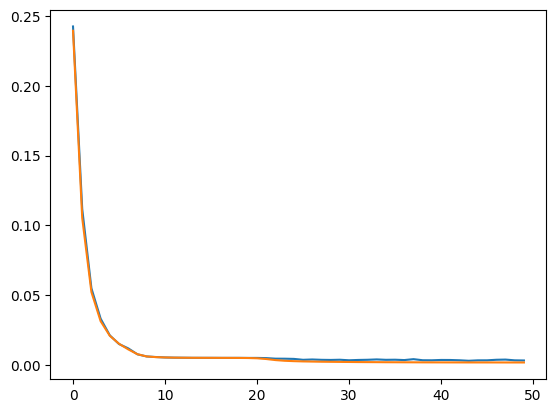

In [73]:
ae = WaveletCNNAE_xc(num_ifos=1, c_depth=5, n_chann=8, l1=20).cpu()
print(sum(p.numel() for p in ae.parameters() if p.requires_grad))

optimizer = optim.Adam(ae.parameters(), lr=0.00002)
loss_func = nn.MSELoss().cpu()
loss_train = np.empty((epochs, ))
loss_validation = np.empty((epochs, ))

for epoch in range(epochs):

    t0 = time.time()
    ae.train()
    for batchidx, x in enumerate(trainDataLoader):
        x = x[0].cpu()
        # print(x.shape)
        # tgt_index = tgt_index.cpu()
        output = ae(x)
        loss = loss_func(output, x)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    ae.eval()
    with torch.no_grad():
        val_loss = 0
        n_correct = 0;
        for batchidx, x in enumerate(validationDataLoader):
            x = x[0].cpu()
            # tgt_index = tgt_index.cpu()
            output = ae(x)
            lossVal = loss_func(output, x)
            val_loss += lossVal.item()
            # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()

        val_loss /= len(validationDataLoader)

    loss_train[epoch] = loss.item()
    loss_validation[epoch] = val_loss
    print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
    print('Time for this epoch: ' + str(time.time() - t0))

#     print(time.time() - t0)

plt.plot(loss_train)
plt.plot(loss_validation)

In [62]:
ae.eval()

WaveletCNNAE_xc(
  (cap_norm): GroupNorm(1, 1, eps=1e-05, affine=True)
  (Conv_In_encode): Conv1d(1, 8, kernel_size=(1,), stride=(1,))
  (Conv_Out_encode): Conv1d(8, 1, kernel_size=(1,), stride=(1,))
  (Conv_In_decode): Conv1d(1, 8, kernel_size=(1,), stride=(1,))
  (Conv_Out_decode): Conv1d(8, 1, kernel_size=(1,), stride=(1,))
  (body_norm_encode): GroupNorm(4, 8, eps=1e-05, affine=True)
  (body_norm_decode): GroupNorm(4, 8, eps=1e-05, affine=True)
  (end_norm_encode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (end_norm_decode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (WaveNet_layers_encode): ModuleList(
    (0): Conv1d(8, 8, kernel_size=(2,), stride=(1,))
    (1): Conv1d(8, 8, kernel_size=(2,), stride=(1,), dilation=(2,))
    (2): Conv1d(8, 8, kernel_size=(2,), stride=(1,), dilation=(4,))
    (3): Conv1d(8, 8, kernel_size=(2,), stride=(1,), dilation=(8,))
    (4): Conv1d(8, 8, kernel_size=(2,), stride=(1,)

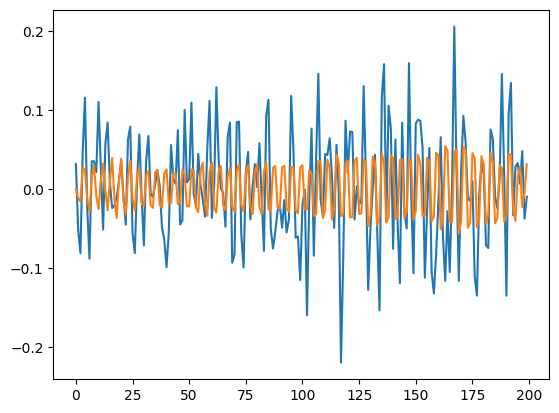

In [74]:
plt.plot(realglitch[0, 0])
plt.plot(ae(torch.FloatTensor(realglitch[0:1])).detach().numpy().flatten())

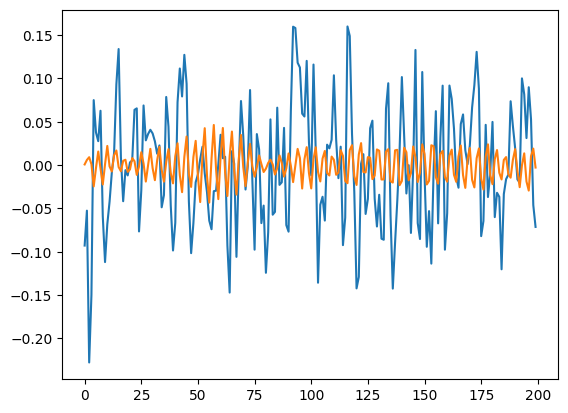

In [75]:
plt.plot(realbkg[0, 0])
plt.plot(ae(torch.FloatTensor(realbkg[0:1])).detach().numpy().flatten())

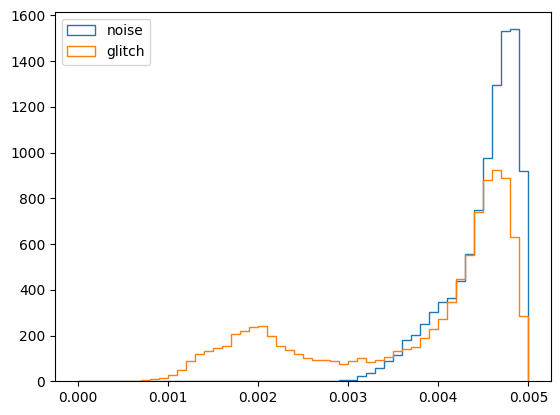

In [76]:
foo = plt.hist(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten(), bins=50, range=(0, 0.005), density=True, histtype="step", label="noise")
foo = plt.hist(np.var(ae(torch.FloatTensor(realglitch_reserved)).detach().numpy() - realglitch_reserved, axis=-1).flatten(), bins=50, range=(0, 0.005), density=True, histtype="step", label="glitch")
plt.legend()

## Test training with BBH samples

### GWAK one

In [179]:
bkg_reserved_list = {}

In [144]:
realbbh = np.load("E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy")[:, 0]
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh = realbbh.reshape(-1,1,200);

In [145]:
realbkg = np.load("E://GWNMMAD_data/Tw_dataset/Datasets/background.npz")['data'][:, 0]
realbkg = realbkg / np.linalg.norm([realbkg], axis = 2).T
realbkg = realbkg.reshape(-1,1,200)

In [8]:
np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz").keys()

KeysView(NpzFile '../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz' with keys: strain, snr)

### Chia-Jui one

In [7]:
realbbh = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['strain'][:, 0]
realbbh_snr = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['snr']
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh_snr = realbbh_snr[perm]
realbbh = realbbh.reshape(-1,1,200);

In [85]:
realbbh = np.load("../Data_cached/injected_BBH_55k_snr48-96_0th_events_before_merger_time_windowlength_200.npz")['strain'][:, 0]
realbbh_snr = np.load("../Data_cached/injected_BBH_55k_snr48-96_0th_events_before_merger_time_windowlength_200.npz")['snr']
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh_snr = realbbh_snr[perm]
realbbh = realbbh.reshape(-1,1,200);

In [7]:
realbbh = np.load("../Data_cached/injected_BBH_55k_snr12-24_0th_events_before_merger_time_windowlength_200.npz")['strain'][:, 0]
realbbh_snr = np.load("../Data_cached/injected_BBH_55k_snr12-24_0th_events_before_merger_time_windowlength_200.npz")['snr']
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh_snr = realbbh_snr[perm]
realbbh = realbbh.reshape(-1,1,200);

In [8]:
realbkg_L = np.load("../Data_cached/real_bkg_2202000_63917s_4000Hz_50ms.npy")[:100000]
# realbbh_snr = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['snr']
# perm = np.random.permutation(len(realbbh))
realbkg_L = realbkg_L / np.linalg.norm([realbkg_L], axis=2).T
# realbbh = realbbh[perm]
# realbbh_snr = realbbh_snr[perm]
realbkg_L = realbkg_L.reshape(-1,1,200);

In [9]:
realbkg = realbkg_L

In [124]:
realbbh.shape

(55000, 1, 200)

In [10]:
realbkg_reserved = realbkg[-int(0.2 * len(realbkg))-int(0.2 * len(realbkg))%2:]
realbkg = realbkg[:-int(0.2 * len(realbkg))-int(0.2 * len(realbkg))%2]

In [11]:
realbbh_reserved = realbbh[-int(0.2 * len(realbbh))-int(0.2 * len(realbbh))%2:]
realbbh = realbbh[:-int(0.2 * len(realbbh))-int(0.2 * len(realbbh))%2]

In [12]:
realbkg_reserved.shape

(20000, 1, 200)

In [128]:
realbbh_reserved.shape

(11000, 1, 200)

In [180]:
bkg_reserved_list['GWAK'] = realbkg_reserved.reshape(-1,1,200)

In [184]:
bkg_reserved_list['Chia-Jui'] = realbkg_reserved.reshape(-1,1,200)

In [129]:
n_BBH = len(realbbh)

rTrain = 1-rValidation

n_BBH_train = int(n_BBH * rTrain)
n_BBH_validation = int(n_BBH * rValidation)

In [130]:
X_train = realbbh[:n_BBH_train]
X_validation = realbbh[-n_BBH_validation:]

train_dataset = TensorDataset(torch.FloatTensor(X_train))
valid_dataset = TensorDataset(torch.FloatTensor(X_validation))

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
validationDataLoader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

4901
Epoch: 0001, Training loss=0.282499, Validation loss=0.263824
Time for this epoch: 5.647062063217163
Epoch: 0002, Training loss=0.173946, Validation loss=0.168829
Time for this epoch: 5.094678640365601
Epoch: 0003, Training loss=0.094525, Validation loss=0.101101
Time for this epoch: 5.088711261749268
Epoch: 0004, Training loss=0.053134, Validation loss=0.048204
Time for this epoch: 5.068888902664185
Epoch: 0005, Training loss=0.023810, Validation loss=0.023254
Time for this epoch: 5.103238344192505
Epoch: 0006, Training loss=0.015431, Validation loss=0.014752
Time for this epoch: 5.168481826782227
Epoch: 0007, Training loss=0.011374, Validation loss=0.011227
Time for this epoch: 5.090434312820435
Epoch: 0008, Training loss=0.009101, Validation loss=0.007758
Time for this epoch: 5.093407392501831
Epoch: 0009, Training loss=0.006946, Validation loss=0.006742
Time for this epoch: 5.114398717880249
Epoch: 0010, Training loss=0.005959, Validation loss=0.006004
Time for this epoch: 5.1

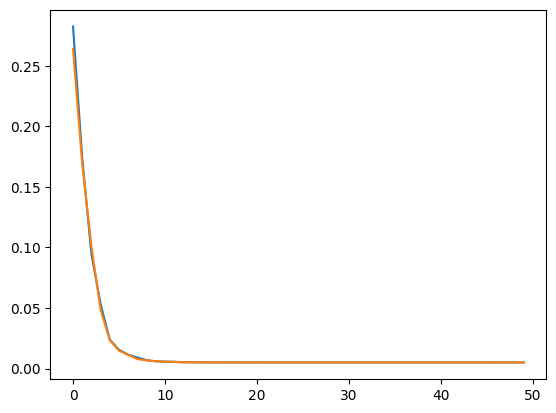

In [93]:
ae = WaveletCNNAE_xc(num_ifos=1, c_depth=6, n_chann=8, l1=10).cuda()
print(sum(p.numel() for p in ae.parameters() if p.requires_grad))

optimizer = optim.Adam(ae.parameters(), lr=0.00002)
loss_func = nn.MSELoss().cuda()
loss_train = np.empty((epochs, ))
loss_validation = np.empty((epochs, ))

for epoch in range(epochs):

    t0 = time.time()
    ae.train()
    for batchidx, x in enumerate(trainDataLoader):
        x = x[0].cuda()
        # print(x.shape)
        # tgt_index = tgt_index.cpu()
        output = ae(x)
        loss = loss_func(output, x)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    ae.eval()
    with torch.no_grad():
        val_loss = 0
        n_correct = 0;
        for batchidx, x in enumerate(validationDataLoader):
            x = x[0].cuda()
            # tgt_index = tgt_index.cpu()
            output = ae(x)
            lossVal = loss_func(output, x)
            val_loss += lossVal.item()
            # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()

        val_loss /= len(validationDataLoader)

    loss_train[epoch] = loss.item()
    loss_validation[epoch] = val_loss
    print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
    print('Time for this epoch: ' + str(time.time() - t0))

#     print(time.time() - t0)

plt.plot(loss_train)
plt.plot(loss_validation)

In [94]:
torch.save(ae.cpu().eval(), '../Model_cached/CNN_large_SNR_Chia-Jui_BBH.torch')

In [6]:
ae = torch.load('../Model_cached/CNN_large_SNR_Chia-Jui_BBH.pt')

In [131]:
version = 'v3'

cnt = 0
for cd in [3, 4, 5, 6]:
    for nch in [4, 8, 12]:
        for nl1 in [10, 20, 30]:
            cnt += 1
            # if cnt >= 2:
            #     continue
            
            modelName = "dep_"+str(cd)+"_chnl_"+str(nch)+"_btn_"+str(nl1);
            ae = WaveletCNNAE_xc(num_ifos=1, c_depth=cd, n_chann=nch, l1=nl1).cuda()
            
            optimizer = optim.Adam(ae.parameters(), lr=0.00005)
            loss_func = nn.MSELoss().cuda()
            loss_train = np.empty((epochs, ))
            loss_validation = np.empty((epochs, ))
            
            for epoch in range(epochs):
            
                t0 = time.time()
                ae.train()
                for batchidx, x in enumerate(trainDataLoader):
                    x = x[0].cuda()
                    # print(x.shape)
                    # tgt_index = tgt_index.cpu()
                    output = ae(x)
                    loss = loss_func(output, x)
                    
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
            
                ae.eval()
                with torch.no_grad():
                    val_loss = 0
                    n_correct = 0;
                    for batchidx, x in enumerate(validationDataLoader):
                        x = x[0].cuda()
                        # tgt_index = tgt_index.cpu()
                        output = ae(x)
                        lossVal = loss_func(output, x)
                        val_loss += lossVal.item()
                        # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()
            
                    val_loss /= len(validationDataLoader)
            
                loss_train[epoch] = loss.item()
                loss_validation[epoch] = val_loss
                # print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
                # print('Time for this epoch: ' + str(time.time() - t0))
            
            #     print(time.time() - t0)
            
            plt.plot(loss_train)
            plt.plot(loss_validation)
            plt.savefig("../Model_cached/CNN_BBH/loss_"+modelName+"_{}.jpg".format(version));
            plt.close();
            ae.eval();
            ae.cpu()
            torch.save(ae, "../Model_cached/CNN_BBH/model_"+modelName+"_{}.pt".format(version));

            foo = plt.hist(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten(), bins=50, range=(0.002, 0.007), density=True, histtype="step", label="noise")
            foo = plt.hist(np.var(ae(torch.FloatTensor(realbbh_reserved)).detach().numpy() - realbbh_reserved, axis=-1).flatten(), bins=50, range=(0.002, 0.007), density=True, histtype="step", label="bbh")
            plt.legend()
            plt.savefig("../Model_cached/CNN_BBH/err_"+modelName+"_{}.jpg".format(version));
            plt.close();
            print([cd, nch, nl1]);

[3, 4, 10]
[3, 4, 20]
[3, 4, 30]
[3, 8, 10]
[3, 8, 20]
[3, 8, 30]


In [134]:
list_roc = {};
version = 'v2'

for cd in [3, 4, 5, 6]:
    for nch in [4, 8, 12]:
        for nl1 in [10, 20, 30]:
            
            modelName = "dep_"+str(cd)+"_chnl_"+str(nch)+"_btn_"+str(nl1);
            key = "c_depth-"+str(cd)+"-n_chann-"+str(nch)+"-bottleneck-"+str(nl1);
            ae = torch.load("../Model_cached/CNN_BBH/model_"+modelName+"_{}.pt".format(version), map_location='cpu').cpu().eval();
            err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
            err_bbh = np.sort(np.var(ae(torch.FloatTensor(realbbh_reserved)).detach().numpy() - realbbh_reserved, axis=-1).flatten())

            fpr = np.empty((99, ))
            tpr = np.empty((99, ))
            
            for i in range(1, 100):
                FP = int(0.01*i*len(err_bbh));
                th = err_bbh[-FP];
                TP = np.sum(err_bkg > th)

                fpr[i-1] = FP/len(err_bbh)
                tpr[i-1] = TP/len(err_bkg)

            list_roc[key] = np.array([fpr, tpr])

torch.save(list_roc, "../Model_cached/CNN_BBH/roc_collection_{}.json".format(version))

In [14]:
version = 'v2'

In [17]:
from sklearn.metrics import auc

In [15]:
list_roc = torch.load("../Model_cached/CNN_BBH/roc_collection_{}.json".format(version))

In [18]:
auc_list = np.zeros((0,1))

for key in list_roc.keys():
    auc_list = np.append(auc_list, auc(list_roc[key][0], list_roc[key][1]))


In [19]:
auc_list

array([0.979327  , 0.670019  , 0.6798265 , 0.979943  , 0.97999875,
       0.979999  , 0.97974575, 0.97999975, 0.979901  , 0.6663585 ,
       0.967192  , 0.979974  , 0.97998475, 0.9799965 , 0.979976  ,
       0.97997975, 0.97999625, 0.97998175, 0.720155  , 0.86524725,
       0.659649  , 0.97298925, 0.605335  , 0.97999675, 0.97998675,
       0.97999925, 0.979998  , 0.65374125, 0.673191  , 0.97992475,
       0.9799955 , 0.979373  , 0.97999925, 0.95953625, 0.97999925,
       0.97999925])

In [20]:
auc_list.max()

0.97999975

c_depth-3-n_chann-8-bottleneck-20
c_depth-3-n_chann-8-bottleneck-30
c_depth-3-n_chann-12-bottleneck-20
c_depth-5-n_chann-12-bottleneck-20
c_depth-5-n_chann-12-bottleneck-30
c_depth-6-n_chann-8-bottleneck-30
c_depth-6-n_chann-12-bottleneck-20
c_depth-6-n_chann-12-bottleneck-30


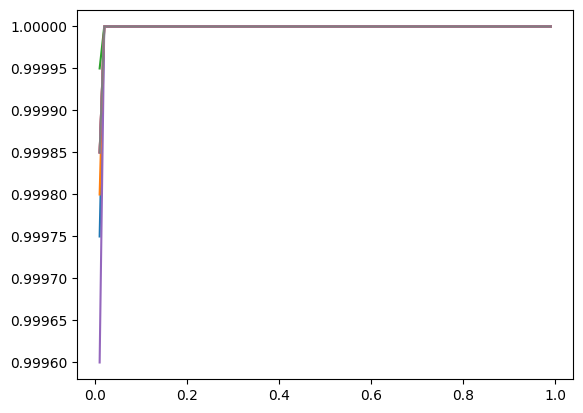

In [21]:
for key in list_roc.keys():
    if auc(list_roc[key][0], list_roc[key][1]) > 0.9799975:
        print(key)
        plt.plot(list_roc[key][0], list_roc[key][1], label = 'best CNN')
    # plt.legend()

c_depth-5-n_chann-12-bottleneck-30


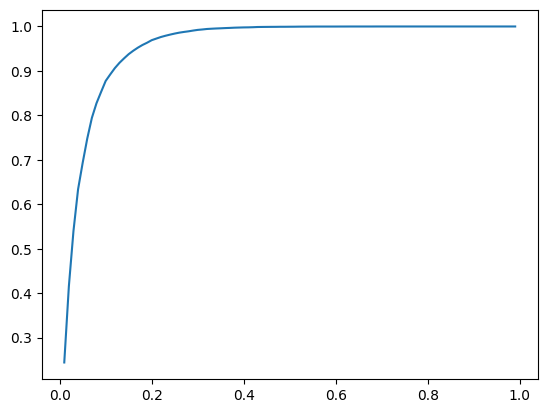

In [138]:
for key in list_roc.keys():
    if auc(list_roc[key][0], list_roc[key][1]) > 0.94:
        print(key)
        plt.plot(list_roc[key][0], list_roc[key][1], label = 'best CNN')
    # plt.legend()

In [ ]:
torch.save(ae, "../results/CNN_bbh.pt")

In [12]:
ae = torch.load('../Model_cached/CNN_bbh.pt')

In [22]:
ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v2.pt')

In [139]:
ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v3.pt')

In [114]:
ae.eval();

In [14]:
X_train.shape

(72000, 1, 200)

In [15]:
X_validation.shape

(8000, 1, 200)

In [16]:
dcd_train = ae(torch.FloatTensor(X_train))
dcd_validation = ae(torch.FloatTensor(X_validation))

In [17]:
dcd_train.shape

torch.Size([72000, 1, 200])

In [84]:
dcd_train.detach_()

tensor([[[ 0.0014, -0.0022, -0.0065,  ..., -0.0220, -0.0186, -0.0077]],

        [[-0.0017, -0.0042, -0.0158,  ..., -0.0321, -0.0281, -0.0131]],

        [[ 0.0021, -0.0034, -0.0044,  ..., -0.0064, -0.0139, -0.0404]],

        ...,

        [[-0.0028, -0.0072, -0.0081,  ...,  0.0051,  0.0119,  0.0130]],

        [[-0.0016, -0.0026, -0.0033,  ..., -0.0088, -0.0078,  0.0146]],

        [[ 0.0007, -0.0025, -0.0203,  ..., -0.0259, -0.0101,  0.0313]]])

In [114]:
train_dataset = TensorDataset(dcd_train.squeeze(1).detach())
valid_dataset = TensorDataset(dcd_validation.squeeze(1).detach())

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
validationDataLoader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [18]:
train_dataset = TensorDataset(dcd_train.detach())
valid_dataset = TensorDataset(dcd_validation.detach())

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
validationDataLoader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

2205
Epoch: 0001, Training loss=0.043170, Validation loss=0.042916
Time for this epoch: 3.315054416656494
Epoch: 0002, Training loss=0.027837, Validation loss=0.028082
Time for this epoch: 3.225048542022705
Epoch: 0003, Training loss=0.016481, Validation loss=0.016300
Time for this epoch: 3.092850685119629
Epoch: 0004, Training loss=0.008321, Validation loss=0.008353
Time for this epoch: 3.1973280906677246
Epoch: 0005, Training loss=0.003972, Validation loss=0.003994
Time for this epoch: 3.248673677444458
Epoch: 0006, Training loss=0.001812, Validation loss=0.001868
Time for this epoch: 3.2264745235443115
Epoch: 0007, Training loss=0.001065, Validation loss=0.001035
Time for this epoch: 3.2189738750457764
Epoch: 0008, Training loss=0.000824, Validation loss=0.000797
Time for this epoch: 3.22127628326416
Epoch: 0009, Training loss=0.000725, Validation loss=0.000762
Time for this epoch: 3.1212329864501953
Epoch: 0010, Training loss=0.000696, Validation loss=0.000759
Time for this epoch: 

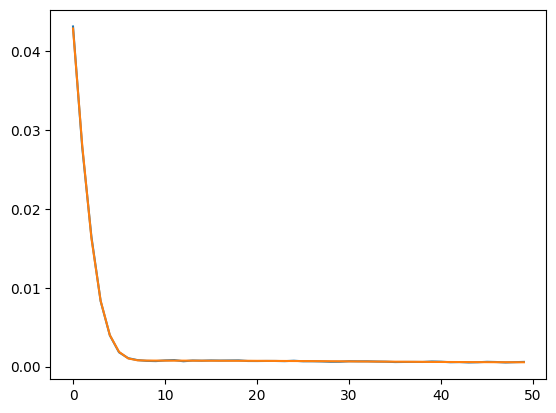

In [123]:
autoencoder = AutoEncoder().cuda()
print(sum(p.numel() for p in autoencoder.parameters() if p.requires_grad))

optimizer = optim.Adam(autoencoder.parameters(), lr=0.00002)
loss_func = nn.MSELoss().cuda()
loss_train = np.empty((epochs, ))
loss_validation = np.empty((epochs, ))

for epoch in range(epochs):

    t0 = time.time()
    autoencoder.train()
    for batchidx, x in enumerate(trainDataLoader):
        x = x[0].cuda()
        # print(x.shape)
        # tgt_index = tgt_index.cpu()
        _, output = autoencoder(x)
        loss = loss_func(output, x)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        n_correct = 0;
        for batchidx, x in enumerate(validationDataLoader):
            x = x[0].cuda()
            # tgt_index = tgt_index.cpu()
            _, output = autoencoder(x)
            lossVal = loss_func(output, x)
            val_loss += lossVal.item()
            # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()

        val_loss /= len(validationDataLoader)

    loss_train[epoch] = loss.item()
    loss_validation[epoch] = val_loss
    print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
    print('Time for this epoch: ' + str(time.time() - t0))

#     print(time.time() - t0)

plt.plot(loss_train)
plt.plot(loss_validation)

In [124]:
torch.save(autoencoder.cpu(), '../Model_cached/DNN_afterCNN_bbh_bottleneck5.pt')

FLag here

2340


Epoch: 0001, Training loss=0.224562, Validation loss=0.222411
Time for this epoch: 7.494725465774536
Epoch: 0002, Training loss=0.171402, Validation loss=0.171336
Time for this epoch: 6.666461706161499
Epoch: 0003, Training loss=0.129719, Validation loss=0.127598
Time for this epoch: 6.566215991973877
Epoch: 0004, Training loss=0.096324, Validation loss=0.095170
Time for this epoch: 6.941073417663574
Epoch: 0005, Training loss=0.071970, Validation loss=0.056903
Time for this epoch: 6.624135255813599
Epoch: 0006, Training loss=0.062071, Validation loss=0.044371
Time for this epoch: 6.954054117202759
Epoch: 0007, Training loss=0.038876, Validation loss=0.031233
Time for this epoch: 7.1823341846466064
Epoch: 0008, Training loss=0.019332, Validation loss=0.022893
Time for this epoch: 6.630807399749756
Epoch: 0009, Training loss=0.009447, Validation loss=0.009709
Time for this epoch: 6.596053600311279
Epoch: 0010, Training loss=0.006020, Validation loss=0.006191
Time for this epoch: 6.80957

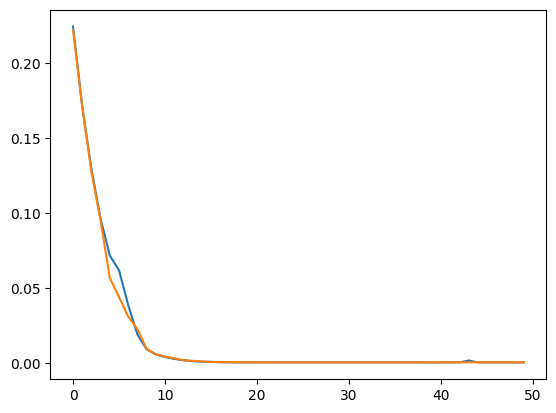

In [42]:
autoencoder = PoolingCNNDNN(1,n_channels=1).cuda()
print(sum(p.numel() for p in autoencoder.parameters() if p.requires_grad))

optimizer = optim.Adam(autoencoder.parameters(), lr=0.00002)
loss_func = nn.MSELoss().cuda()
loss_train = np.empty((epochs, ))
loss_validation = np.empty((epochs, ))

for epoch in range(epochs):

    t0 = time.time()
    autoencoder.train()
    for batchidx, x in enumerate(trainDataLoader):
        x = x[0].cuda()
        # print(x.shape)
        # tgt_index = tgt_index.cpu()
        _, output = autoencoder(x)
        loss = loss_func(output, x)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        n_correct = 0;
        for batchidx, x in enumerate(validationDataLoader):
            x = x[0].cuda()
            # tgt_index = tgt_index.cpu()
            _, output = autoencoder(x)
            lossVal = loss_func(output, x)
            val_loss += lossVal.item()
            # n_correct += torch.eq(tgt_index, torch.argmax(output, dim=1)).sum().item()

        val_loss /= len(validationDataLoader)

    loss_train[epoch] = loss.item()
    loss_validation[epoch] = val_loss
    print('Epoch: %04d, Training loss=%f, Validation loss=%f' % (epoch+1, loss_train[epoch], val_loss))
    print('Time for this epoch: ' + str(time.time() - t0))

#     print(time.time() - t0)

plt.plot(loss_train)
plt.plot(loss_validation)

In [82]:
output.shape

torch.Size([32, 200])

In [83]:
x.shape

torch.Size([32, 200])

In [11]:
realbbh.shape

(1459, 1, 200)

In [16]:
realbbh_snr

array([14.34055418,  9.71541595, 38.15313462, ...,  7.78476064,
       17.67926561, 16.34812571])

In [14]:
np.argwhere(realbbh_snr > 24)

array([[   2],
       [   7],
       [  11],
       [  12],
       [  16],
       [  21],
       [  32],
       [  36],
       [  38],
       [  40],
       [  49],
       [  60],
       [  61],
       [  65],
       [  71],
       [  77],
       [  79],
       [  82],
       [  96],
       [  97],
       [  98],
       [ 102],
       [ 104],
       [ 108],
       [ 113],
       [ 116],
       [ 118],
       [ 129],
       [ 132],
       [ 135],
       [ 138],
       [ 141],
       [ 142],
       [ 143],
       [ 144],
       [ 146],
       [ 153],
       [ 155],
       [ 156],
       [ 163],
       [ 165],
       [ 166],
       [ 168],
       [ 169],
       [ 171],
       [ 173],
       [ 176],
       [ 188],
       [ 189],
       [ 192],
       [ 194],
       [ 196],
       [ 199],
       [ 202],
       [ 205],
       [ 209],
       [ 211],
       [ 213],
       [ 224],
       [ 231],
       [ 233],
       [ 235],
       [ 239],
       [ 244],
       [ 245],
       [ 246],
       [ 2

In [95]:
realbkg.shape

(100000, 1, 200)

In [44]:
autoencoder.cpu()

PoolingCNNDNN(
  (conv1): Conv1d(1, 1, kernel_size=(3,), stride=(1,), padding=(1,))
  (batch1): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU()
  (pool1): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dnn1): Linear(in_features=100, out_features=10, bias=True)
  (batch_dnn1): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act_dnn1): ReLU()
  (dnn2): Linear(in_features=10, out_features=100, bias=True)
  (batch_dnn2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act_dnn2): ReLU()
  (pool3): MaxUnpool1d(kernel_size=(2,), stride=(2,), padding=(0,))
  (conv4): Conv1d(1, 1, kernel_size=(3,), stride=(1,), padding=(1,))
  (final): Tanh()
)

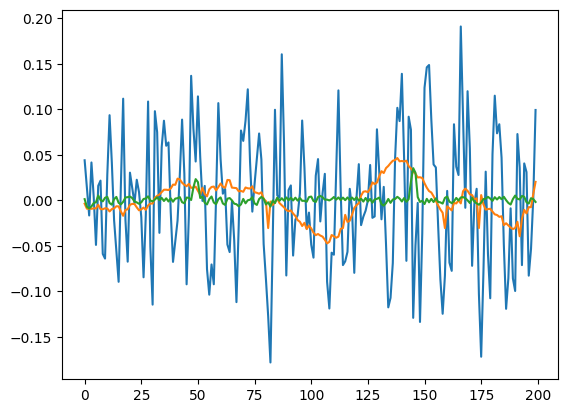

In [50]:
plt.plot(realbkg[1, 0])
plt.plot(ae(torch.FloatTensor(realbkg[1:2])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbkg[1:2])))[1].detach().numpy().flatten())

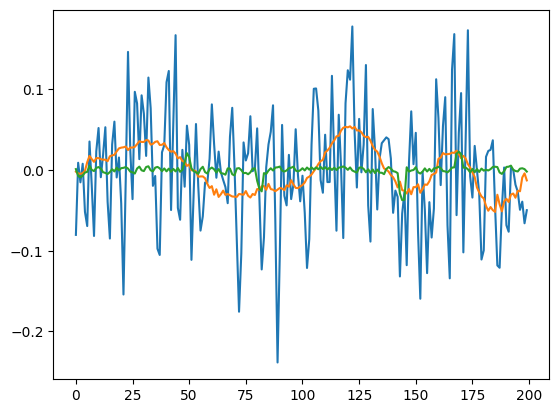

In [51]:
plt.plot(realbbh[2, 0])
plt.plot(ae(torch.FloatTensor(realbbh[2:3])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbbh[2:3])))[1].detach().numpy().flatten())

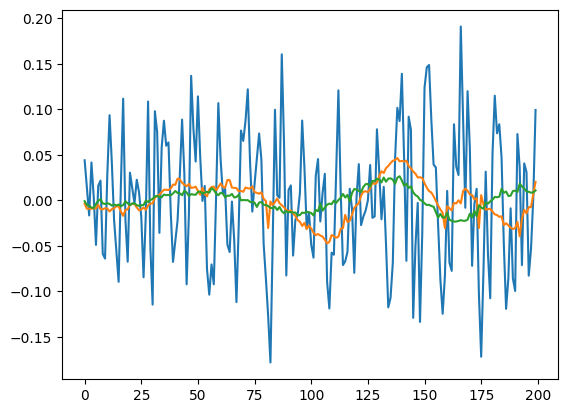

In [125]:
plt.plot(realbkg[1, 0])
plt.plot(ae(torch.FloatTensor(realbkg[1:2])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbkg[1:2])))[1].detach().numpy().flatten())

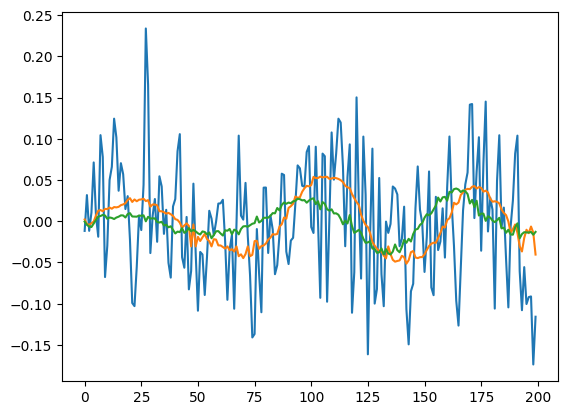

In [126]:
plt.plot(realbbh[2, 0])
plt.plot(ae(torch.FloatTensor(realbbh[2:3])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbbh[2:3])))[1].detach().numpy().flatten())

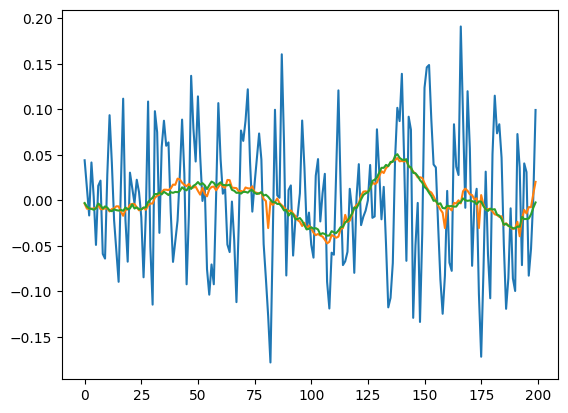

In [117]:
plt.plot(realbkg[1, 0])
plt.plot(ae(torch.FloatTensor(realbkg[1:2])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbkg[1:2])))[1].detach().numpy().flatten())

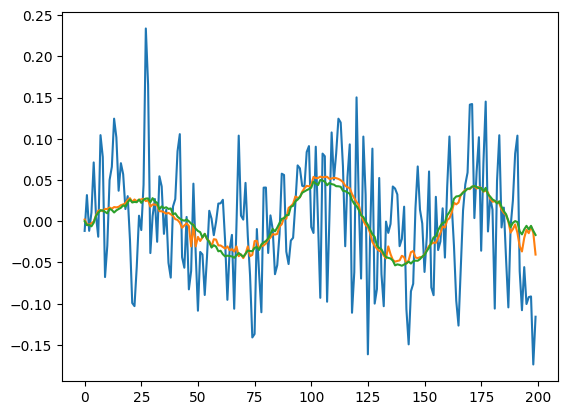

In [118]:
plt.plot(realbbh[2, 0])
plt.plot(ae(torch.FloatTensor(realbbh[2:3])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbbh[2:3])))[1].detach().numpy().flatten())

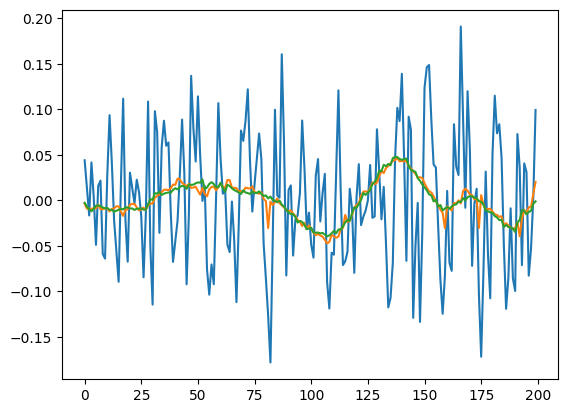

In [104]:
plt.plot(realbkg[1, 0])
plt.plot(ae(torch.FloatTensor(realbkg[1:2])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbkg[1:2])))[1].detach().numpy().flatten())

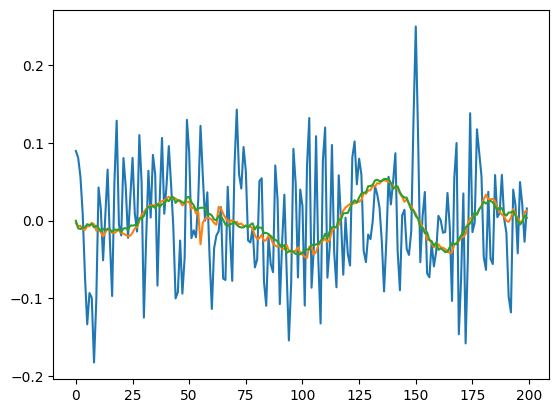

In [105]:
plt.plot(realbkg[0, 0])
plt.plot(ae(torch.FloatTensor(realbkg[0:1])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbkg[0:1])))[1].detach().numpy().flatten())

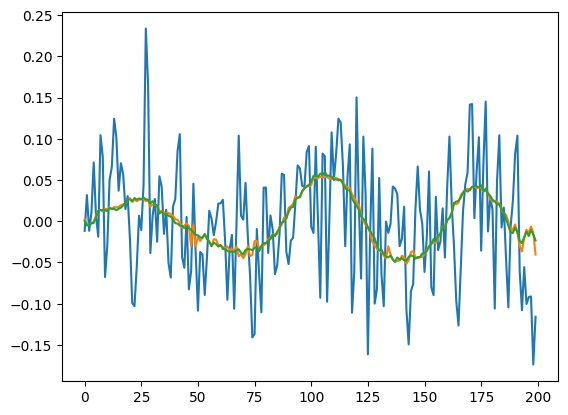

In [106]:
plt.plot(realbbh[2, 0])
plt.plot(ae(torch.FloatTensor(realbbh[2:3])).detach().numpy().flatten())
plt.plot(autoencoder(ae(torch.FloatTensor(realbbh[2:3])))[1].detach().numpy().flatten())

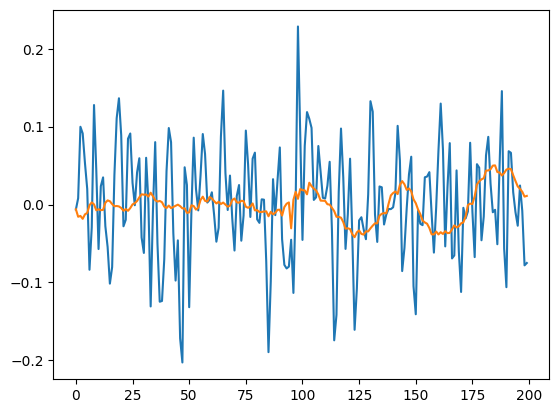

In [16]:
plt.plot(realbbh[0, 0])
plt.plot(ae(torch.FloatTensor(realbbh[0:1])).detach().numpy().flatten())

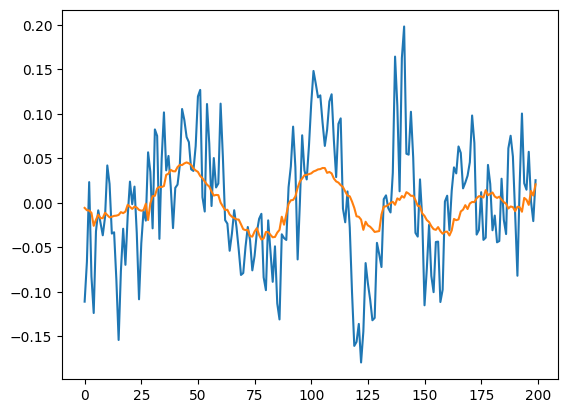

In [17]:
idx = 2

plt.plot(realbbh[idx, 0])
plt.plot(ae(torch.FloatTensor(realbbh[idx:idx+1])).detach().numpy().flatten())

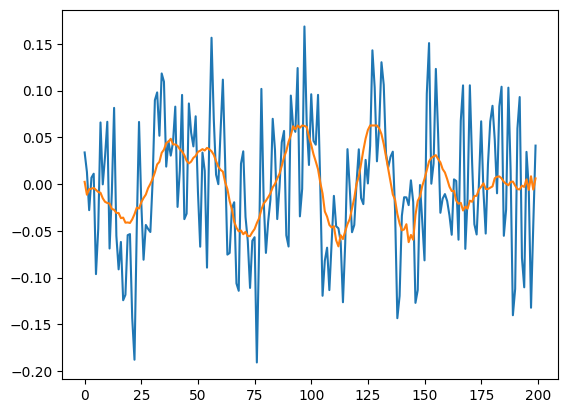

In [140]:
plt.plot(realbbh[0, 0])
plt.plot(ae(torch.FloatTensor(realbbh[0:1])).detach().numpy().flatten())

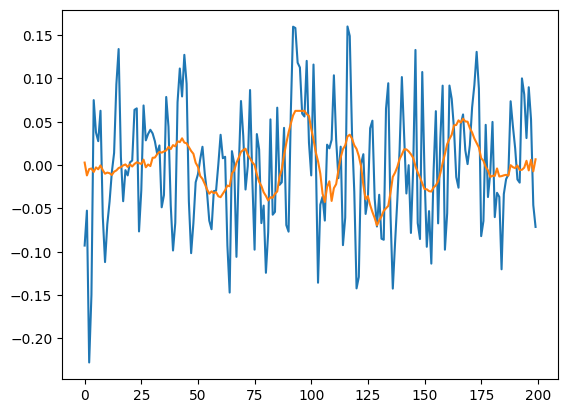

In [141]:
plt.plot(realbkg[0, 0])
plt.plot(ae(torch.FloatTensor(realbkg[0:1])).detach().numpy().flatten())

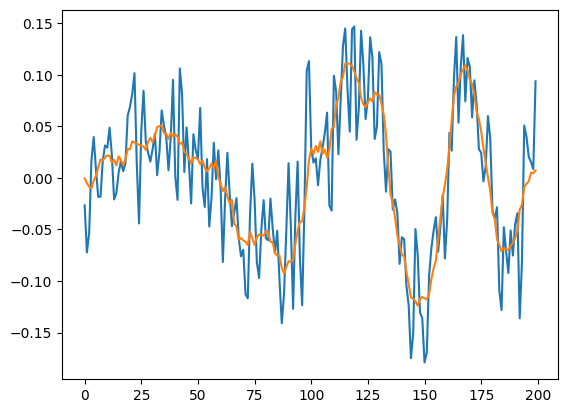

In [115]:
plt.plot(realbbh[0, 0])
plt.plot(ae(torch.FloatTensor(realbbh[0:1])).detach().numpy().flatten())

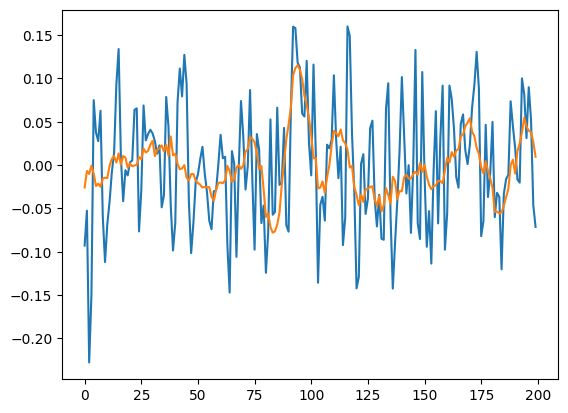

In [116]:
plt.plot(realbkg[0, 0])
plt.plot(ae(torch.FloatTensor(realbkg[0:1])).detach().numpy().flatten())

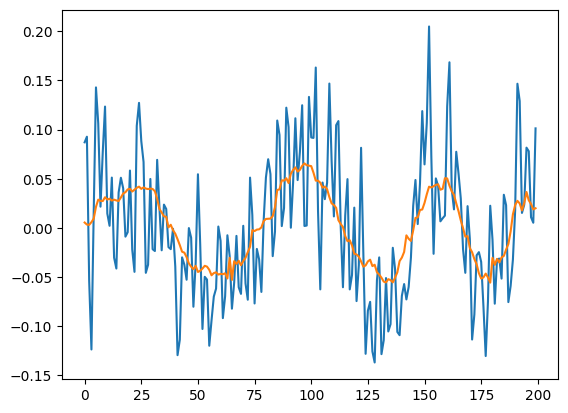

In [26]:
plt.plot(realbbh[0, 0])
plt.plot(ae(torch.FloatTensor(realbbh[0:1])).detach().numpy().flatten())

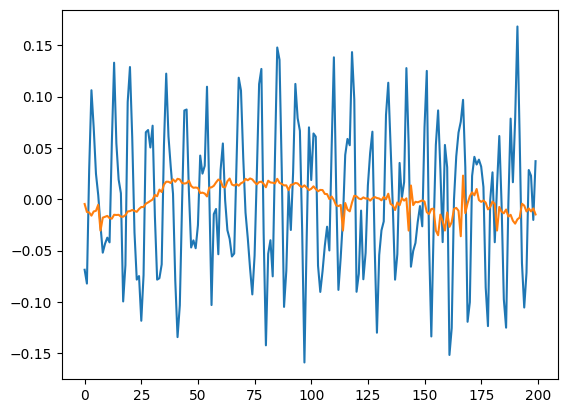

In [29]:
plt.plot(realbkg[0, 0])
plt.plot(ae(torch.FloatTensor(realbkg[0:1])).detach().numpy().flatten())

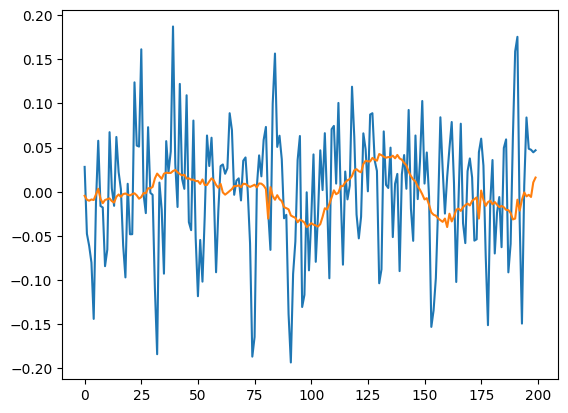

In [21]:
idx = 11

plt.plot(realbkg_L[idx, 0])
plt.plot(ae(torch.FloatTensor(realbkg_L[idx:idx + 1])).detach().numpy().flatten())

In [275]:
idx_list = np.array([2])
snr_list = ['5-12','12-24','24-48','48-96']

realbbh_list = {}

for idx in idx_list:
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)

realbbh_data = np.load('E:\GWNMMAD_data\Tw_dataset\Datasets\\bbh_for_challenge.npy').reshape(-1,200)
realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T

realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T

realbbh_data = realbbh_data.reshape(-1,400)
realbbh_data_fft = realbbh_data_fft.reshape(-1,202)


realbbh_list['GWAK'] = realbbh_data[:,:200].reshape(-1,1,200)

In [239]:
idx_list = np.array([2])
snr_list = ['5-12','12-24','24-48','48-96']

purebbh_list = {}

for idx in idx_list:
    for snr_range in snr_list:
    
        purebbh_data = np.load('../Data_cached/pure_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        purebbh_data = purebbh_data / np.linalg.norm([purebbh_data], axis=2).T
        
        purebbh_data_fft = abs(np.fft.rfft(purebbh_data))
        purebbh_data_fft = purebbh_data_fft / np.linalg.norm([purebbh_data_fft], axis=2).T
        
        purebbh_data = purebbh_data.reshape(-1,400)
        purebbh_data_fft = purebbh_data_fft.reshape(-1,202)
        
        purebbh_list[snr_range] = purebbh_data[:,:200].reshape(-1,1,200)

# purebbh_data = np.load('E:\GWNMMAD_data\Tw_dataset\Datasets\\bbh_for_challenge.npy').reshape(-1,200)
# purebbh_data = purebbh_data / np.linalg.norm([purebbh_data], axis=2).T

# purebbh_data_fft = abs(np.fft.rfft(purebbh_data))
# purebbh_data_fft = purebbh_data_fft / np.linalg.norm([purebbh_data_fft], axis=2).T

# purebbh_data = purebbh_data.reshape(-1,400)
# purebbh_data_fft = purebbh_data_fft.reshape(-1,202)


purebbh_list['GWAK'] = np.zeros((10000,1,200))

In [188]:
models_pic_plot = {}
models_pic_plot['GWAK'] = torch.load('../Model_cached/CNN_BBH/model_dep_6_chnl_4_btn_10.pt')

In [192]:
bkg_reserved_list['GWAK'] = bkg_reserved_list['GWAK'].reshape(-1,1,200)
bkg_reserved_list['Chia-Jui'] = bkg_reserved_list['Chia-Jui'].reshape(-1,1,200)

In [205]:
model(torch.FloatTensor(data))[0].shape

torch.Size([1, 200])

In [202]:
model(torch.FloatTensor(data)).shape

torch.Size([1, 1, 200])

RuntimeError: Expected weight to be a vector of size equal to the number of channels in input, but got weight of shape [1] and input of shape [1, 200]

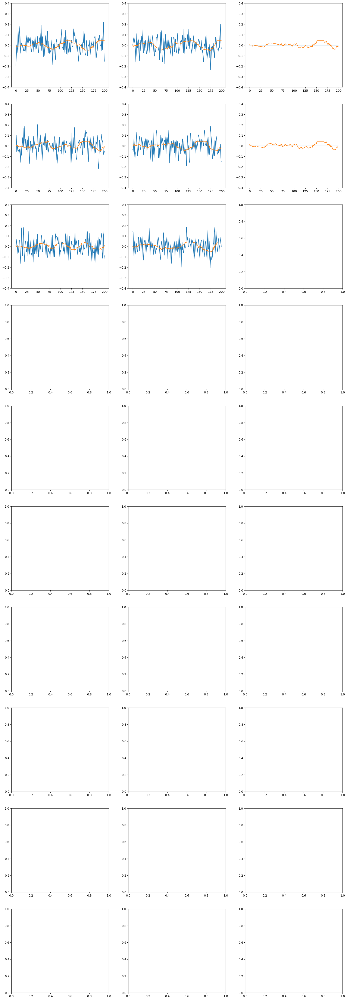

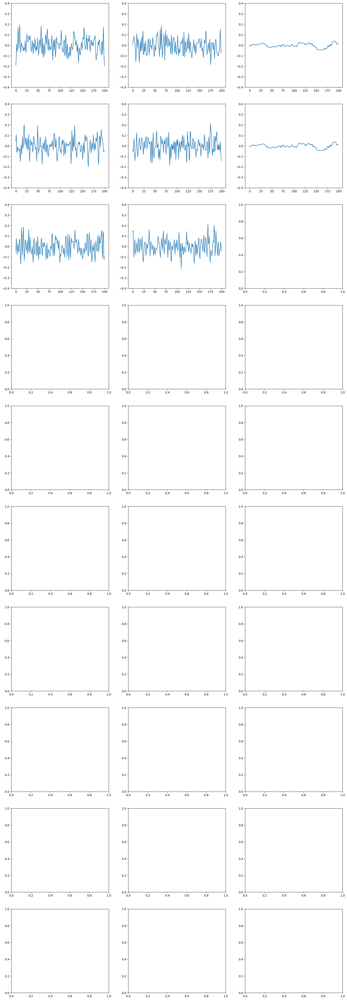

In [223]:
fig1, axes1 = plt.subplots(nrows=10, ncols=2, figsize=(20, 60))
fig2, axes2 = plt.subplots(nrows=10, ncols=2, figsize=(20, 60))
# idx_list = np.array([0])
snr_list = ['GWAK', '5-12','12-24','24-48','48-96']

model_type = ['GWAK']

random_idx = np.random.randint(min(len(realbkg_reserved), min(len(value) for value in realbbh_list.values())), size = (10,2))

for i in range(10):

    data_keys = snr_list[i//2]

    if i < 2:
        noise_data = bkg_reserved_list['GWAK'][[random_idx[i][0]]]

        bbh_data = realbbh_list['GWAK'][[random_idx[i][1]]]

    else:
        noise_data = bkg_reserved_list['Chia-Jui'][[random_idx[i][0]]]

        bbh_data = realbbh_list[data_keys][[random_idx[i][1]]]

    for j in range(2 * len(models_pic_plot) + 1):
        
        model_keys = model_type[j//2]

        model = models_pic_plot[model_keys]

        if j%2 == 0:
            data = noise_data
        else:
            data = bbh_data

        dcd = model(torch.FloatTensor(data))[0].detach().numpy()
            # foo = plt.hist(np.var(realbbh_list[snr][:,:101]-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

        axes1[i,j].plot(data.flatten(), label="initial")
        axes1[i,j].plot(dcd.flatten(), label="reconstructed")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes1[i,j].set_ylim(-0.4,0.4)

        axes2[i,j].plot((data-dcd).flatten(), label="residual")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes2[i,j].set_ylim(-0.4,0.4)


plt.legend()

fig1.show()
fig2.show()

In [242]:
dcd_bkg.shape

(1, 200)

In [243]:
model(torch.FloatTensor(bkg_filtered)).shape

torch.Size([20000, 1, 200])

In [244]:
bkg_filtered.shape

(20000, 1, 200)

In [248]:
realbbh_list

{'5-12': array([[[ 0.10122384,  0.10209395, -0.03046324, ...,  0.05569086,
           0.02111848,  0.09464826]],
 
        [[ 0.05111974, -0.05491014, -0.08085407, ..., -0.05173961,
          -0.00378349,  0.04950469]],
 
        [[ 0.00854793,  0.0970148 ,  0.03874716, ...,  0.06256862,
          -0.01119854, -0.0673454 ]],
 
        ...,
 
        [[ 0.05035872, -0.01814082, -0.03808809, ...,  0.00443981,
          -0.14644654, -0.10872386]],
 
        [[-0.00540532,  0.15308804,  0.13001231, ..., -0.02206064,
          -0.15717567, -0.0101896 ]],
 
        [[ 0.11449847,  0.01233154, -0.04722135, ..., -0.0877181 ,
           0.04711664,  0.05894804]]]),
 '12-24': array([[[-0.05978963,  0.05989958,  0.01634039, ..., -0.01354212,
           0.01171263,  0.02860263]],
 
        [[ 0.01928191,  0.02479459, -0.03037676, ...,  0.04355612,
           0.08139087,  0.03108288]],
 
        [[ 0.00609754, -0.100003  , -0.17287996, ..., -0.02277724,
           0.06497801,  0.06018441]],
 
     

In [250]:
model

WaveletCNNAE_xc(
  (cap_norm): GroupNorm(1, 1, eps=1e-05, affine=True)
  (Conv_In_encode): Conv1d(1, 4, kernel_size=(1,), stride=(1,))
  (Conv_Out_encode): Conv1d(4, 1, kernel_size=(1,), stride=(1,))
  (Conv_In_decode): Conv1d(1, 4, kernel_size=(1,), stride=(1,))
  (Conv_Out_decode): Conv1d(4, 1, kernel_size=(1,), stride=(1,))
  (body_norm_encode): GroupNorm(4, 4, eps=1e-05, affine=True)
  (body_norm_decode): GroupNorm(4, 4, eps=1e-05, affine=True)
  (end_norm_encode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (end_norm_decode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (WaveNet_layers_encode): ModuleList(
    (0): Conv1d(4, 4, kernel_size=(2,), stride=(1,))
    (1): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(2,))
    (2): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(4,))
    (3): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(8,))
    (4): Conv1d(4, 4, kernel_size=(2,), stride=(1,)

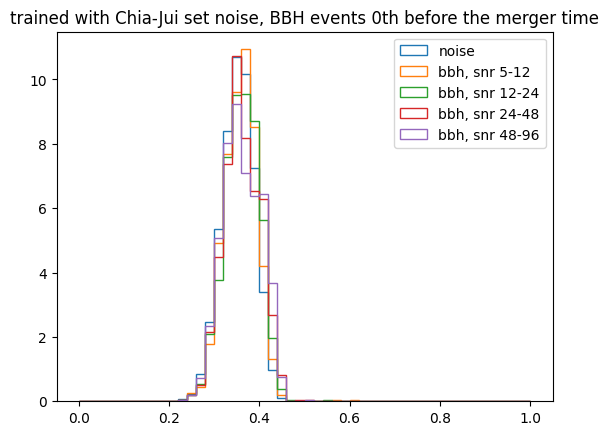

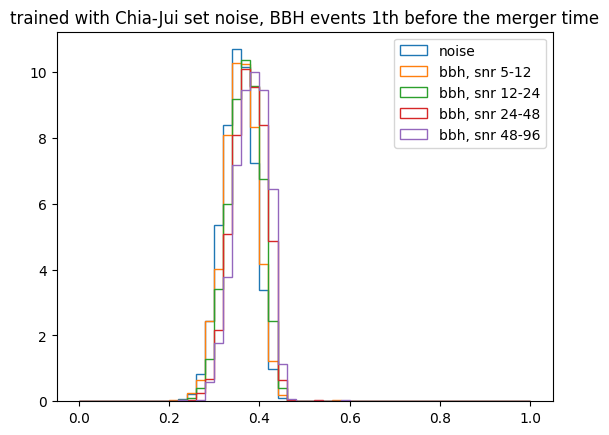

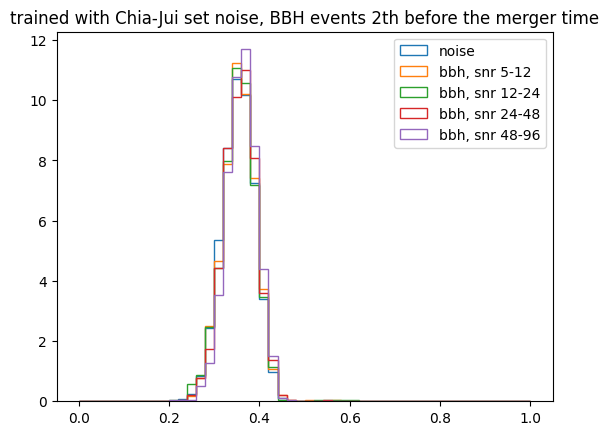

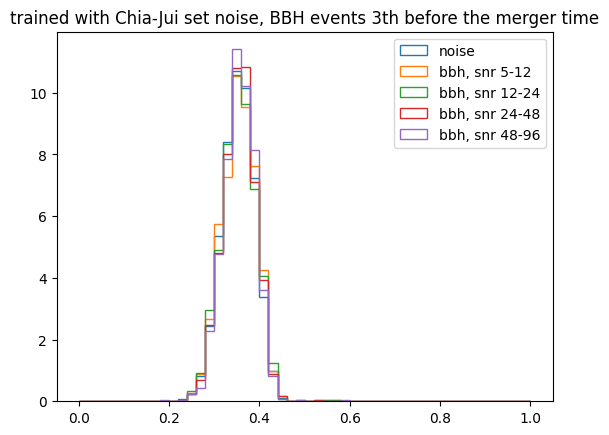

In [261]:
idx_list = np.arange(4)
snr_list = ['5-12','12-24','24-48','48-96']

bkg_filtered = bkg_reserved_list['Chia-Jui']

for idx in idx_list:
    
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
    dcd_bkg = model(torch.FloatTensor(bkg_filtered)).detach().numpy()
    # dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
    # dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
    # dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

    foo = plt.hist(np.linalg.norm(dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 1), bins=50, density=True, label="noise")
    # foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
    # foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
    # foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

    for snr in snr_list:
        dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
        foo = plt.hist(np.linalg.norm(dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 1), bins=50, density=True, label="bbh, snr " + snr)

    plt.title("trained with Chia-Jui set noise, BBH events {}th before the merger time".format(idx))
    # plt.axvline(c0[currentStep], color="k", linestyle="--")
    # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
    # plt.ylim(0,2000)
    plt.legend()
    plt.show()

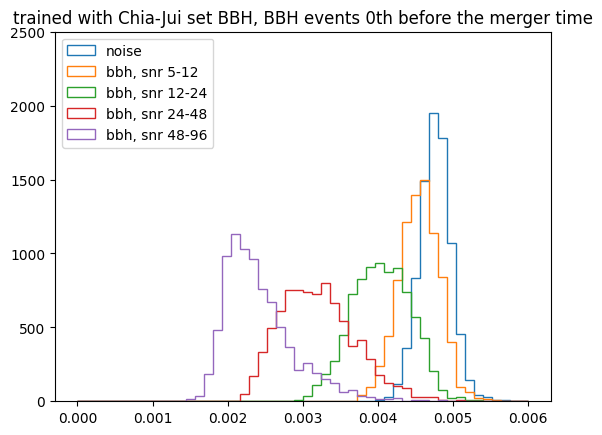

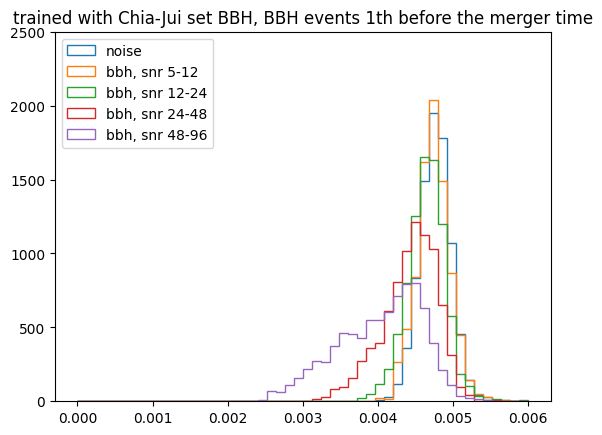

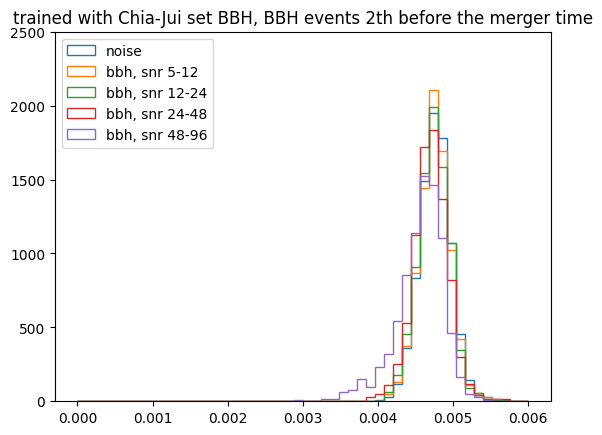

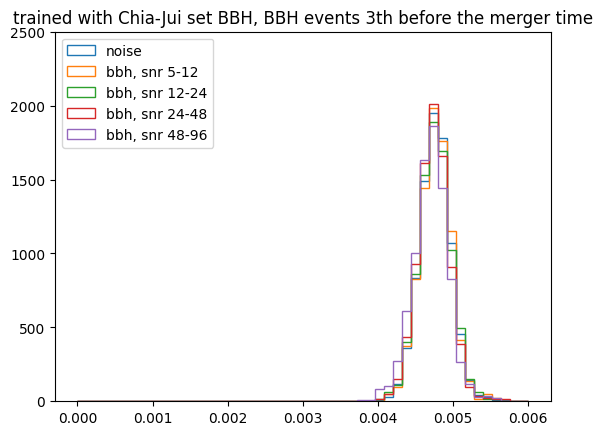

In [142]:
# v3 trained with low snr bbh

model = ae
idx_list = np.arange(4)
snr_list = ['5-12','12-24','24-48','48-96']

bkg_filtered = realbkg_reserved

for idx in idx_list:
    
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
    dcd_bkg = model(torch.FloatTensor(bkg_filtered)).detach().numpy()
    # dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
    # dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
    # dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

    foo = plt.hist(np.var(bkg_filtered-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="noise")
    # foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
    # foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
    # foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

    for snr in snr_list:
        dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
        foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="bbh, snr " + snr)

    plt.title("trained with Chia-Jui set BBH, BBH events {}th before the merger time".format(idx))
    # plt.axvline(c0[currentStep], color="k", linestyle="--")
    # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
    plt.ylim(0,2500)
    plt.legend()
    plt.show()

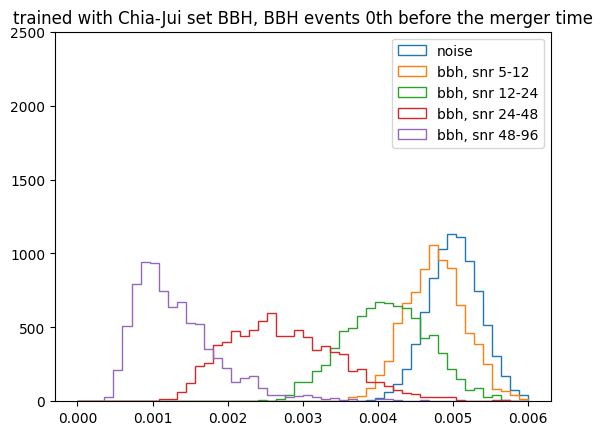

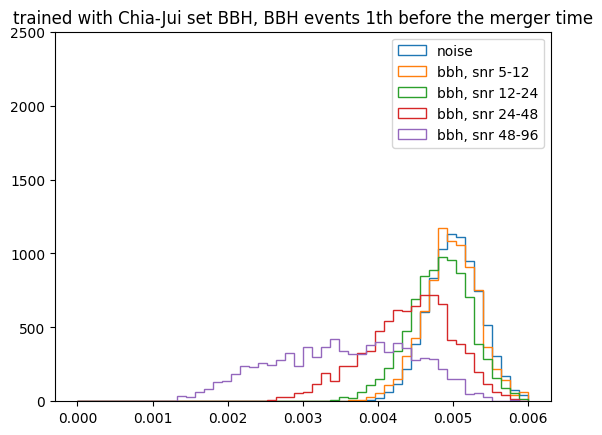

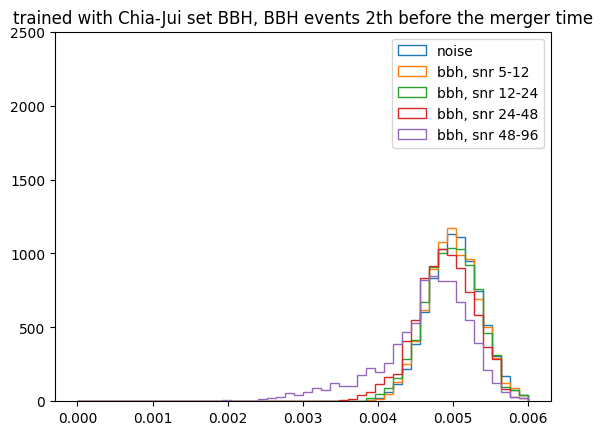

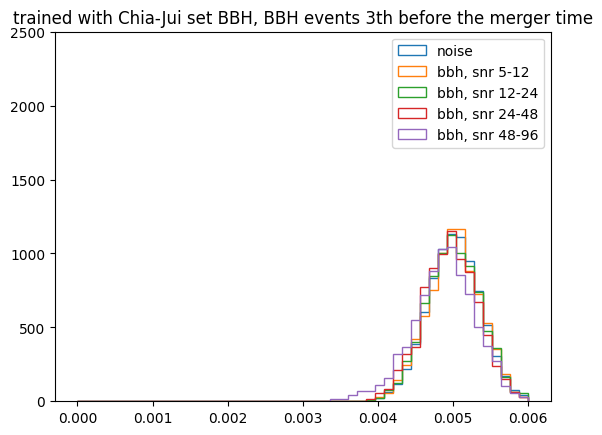

In [25]:
# v2 trained with high snr bbh

model = ae
idx_list = np.arange(4)
snr_list = ['5-12','12-24','24-48','48-96']

bkg_filtered = realbkg_reserved

for idx in idx_list:
    
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
    dcd_bkg = model(torch.FloatTensor(bkg_filtered)).detach().numpy()
    # dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
    # dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
    # dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

    foo = plt.hist(np.var(bkg_filtered-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="noise")
    # foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
    # foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
    # foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

    for snr in snr_list:
        dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
        foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="bbh, snr " + snr)

    plt.title("trained with Chia-Jui set BBH, BBH events {}th before the merger time".format(idx))
    # plt.axvline(c0[currentStep], color="k", linestyle="--")
    # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
    plt.ylim(0,2500)
    plt.legend()
    plt.show()

Text(0.5, 1.0, 'ROC performance of CNN AE for BBH, trained with SNR 48-96 Chia-Jui BBH')

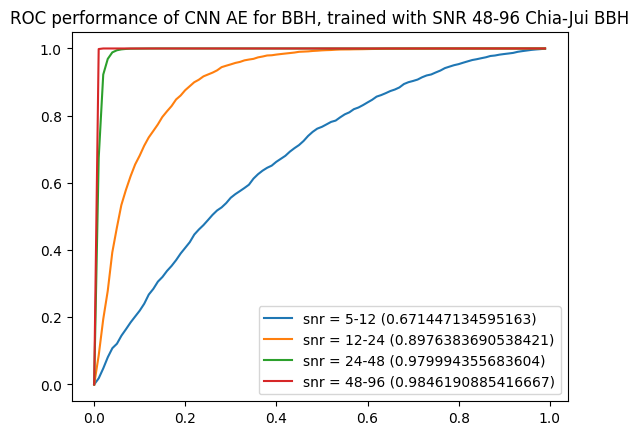

In [42]:
list_roc = {}
idx_list = [0]

for idx in idx_list:
    
    for snr_range in snr_list: 
        
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
        
        ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v2.pt')
        
        err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
        err_bbh = np.sort(np.var(ae(torch.FloatTensor(realbbh_list[snr_range])).detach().numpy() - realbbh_list[snr_range], axis=-1).flatten())

        fpr = np.zeros((100, ))
        tpr = np.zeros((100, ))
        
        for i in range(1, 100):
            FP = int(0.01*i*len(err_bbh));
            th = err_bbh[-FP];
            TP = np.sum(err_bkg > th)

            fpr[i] = FP/len(err_bbh)
            tpr[i] = TP/len(err_bkg)
        
        list_roc[snr_range] = np.array([fpr, tpr])
        
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {} ({})'.format(key, auc(list_roc[key][0], list_roc[key][1])))
    
plt.legend()
plt.title('ROC performance of CNN AE for BBH, trained with SNR 48-96 Chia-Jui BBH')

Text(0.5, 1.0, 'ROC performance of CNN AE for BBH, trained with SNR 48-96 Chia-Jui BBH')

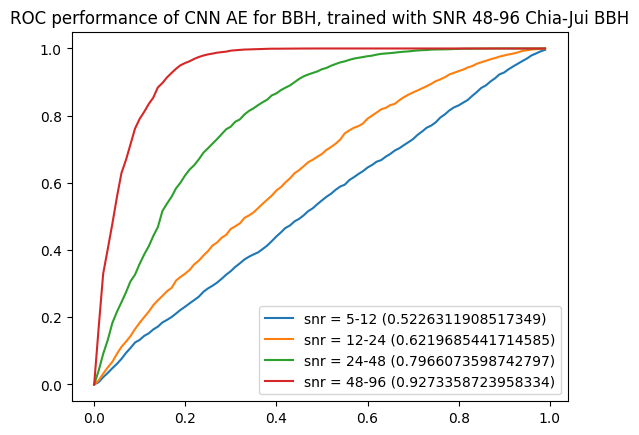

In [46]:
list_roc = {}
idx_list = [1]

for idx in idx_list:
    
    for snr_range in snr_list: 
        
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
        
        ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v2.pt')
        
        err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
        err_bbh = np.sort(np.var(ae(torch.FloatTensor(realbbh_list[snr_range])).detach().numpy() - realbbh_list[snr_range], axis=-1).flatten())

        fpr = np.zeros((100, ))
        tpr = np.zeros((100, ))
        
        for i in range(1, 100):
            FP = int(0.01*i*len(err_bbh));
            th = err_bbh[-FP];
            TP = np.sum(err_bkg > th)

            fpr[i] = FP/len(err_bbh)
            tpr[i] = TP/len(err_bkg)
        
        list_roc[snr_range] = np.array([fpr, tpr])
        
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {} ({})'.format(key, auc(list_roc[key][0], list_roc[key][1])))
    
plt.legend()
plt.title('ROC performance of CNN AE for BBH, trained with SNR 48-96 Chia-Jui BBH')

Text(0.5, 1.0, 'ROC performance of CNN AE for BBH, trained with SNR 12-24 Chia-Jui BBH')

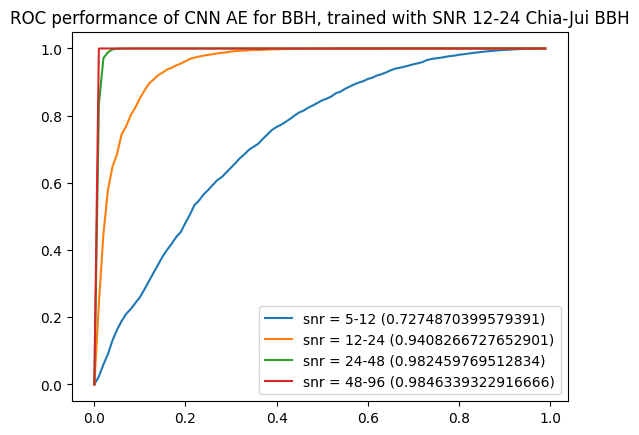

In [43]:
list_roc = {}
idx_list = [0]

for idx in idx_list:
    
    for snr_range in snr_list: 
        
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
        
        ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v3.pt')
        
        err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
        err_bbh = np.sort(np.var(ae(torch.FloatTensor(realbbh_list[snr_range])).detach().numpy() - realbbh_list[snr_range], axis=-1).flatten())

        fpr = np.zeros((100, ))
        tpr = np.zeros((100, ))
        
        for i in range(1, 100):
            FP = int(0.01*i*len(err_bbh));
            th = err_bbh[-FP];
            TP = np.sum(err_bkg > th)

            fpr[i] = FP/len(err_bbh)
            tpr[i] = TP/len(err_bkg)
        
        list_roc[snr_range] = np.array([fpr, tpr])
        
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {} ({})'.format(key, auc(list_roc[key][0], list_roc[key][1])))
    
plt.legend()
plt.title('ROC performance of CNN AE for BBH, trained with SNR 12-24 Chia-Jui BBH')

Text(0.5, 1.0, 'ROC performance of CNN AE for BBH, trained with SNR 12-24 Chia-Jui BBH')

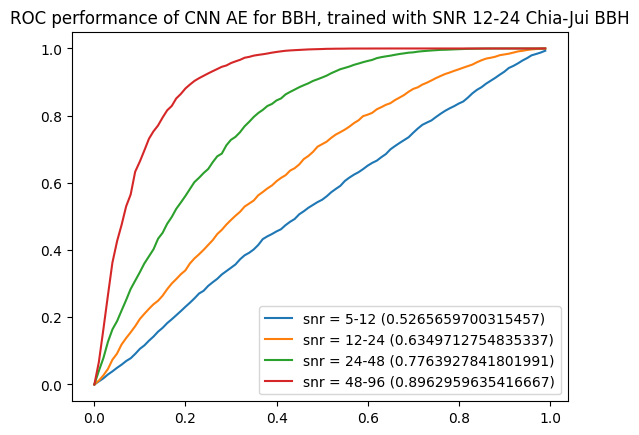

In [45]:
list_roc = {}
idx_list = [1]

for idx in idx_list:
    
    for snr_range in snr_list: 
        
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
        
        ae = torch.load('../Model_cached/CNN_BBH/model_dep_5_chnl_12_btn_30_v3.pt')
        
        err_bkg = np.sort(np.var(ae(torch.FloatTensor(realbkg_reserved)).detach().numpy() - realbkg_reserved, axis=-1).flatten())
        err_bbh = np.sort(np.var(ae(torch.FloatTensor(realbbh_list[snr_range])).detach().numpy() - realbbh_list[snr_range], axis=-1).flatten())

        fpr = np.zeros((100, ))
        tpr = np.zeros((100, ))
        
        for i in range(1, 100):
            FP = int(0.01*i*len(err_bbh));
            th = err_bbh[-FP];
            TP = np.sum(err_bkg > th)

            fpr[i] = FP/len(err_bbh)
            tpr[i] = TP/len(err_bkg)
        
        list_roc[snr_range] = np.array([fpr, tpr])
        
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {} ({})'.format(key, auc(list_roc[key][0], list_roc[key][1])))
    
plt.legend()
plt.title('ROC performance of CNN AE for BBH, trained with SNR 12-24 Chia-Jui BBH')

In [37]:
list_roc

{'5-12': array([[0.        , 0.00998948, 0.01997897, 0.02996845, 0.03995794,
         0.04994742, 0.05993691, 0.06992639, 0.07991588, 0.08990536,
         0.09989485, 0.10988433, 0.11987382, 0.1298633 , 0.13985279,
         0.14984227, 0.15983176, 0.16982124, 0.17981073, 0.18980021,
         0.1997897 , 0.20977918, 0.21976866, 0.22975815, 0.23974763,
         0.24973712, 0.2597266 , 0.26971609, 0.27970557, 0.28969506,
         0.29968454, 0.30967403, 0.31966351, 0.329653  , 0.33964248,
         0.34963197, 0.35962145, 0.36961094, 0.37960042, 0.38958991,
         0.39957939, 0.40956887, 0.41955836, 0.42954784, 0.43953733,
         0.44952681, 0.4595163 , 0.46950578, 0.47949527, 0.48948475,
         0.5       , 0.50998948, 0.51997897, 0.52996845, 0.53995794,
         0.54994742, 0.55993691, 0.56992639, 0.57991588, 0.58990536,
         0.59989485, 0.60988433, 0.61987382, 0.6298633 , 0.63985279,
         0.64984227, 0.65983176, 0.66982124, 0.67981073, 0.68980021,
         0.6997897 , 0.709

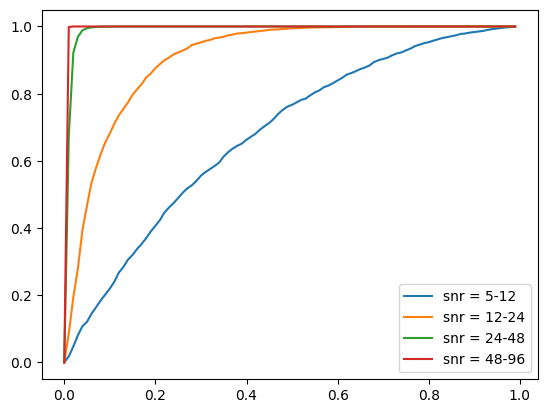

In [38]:
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {}'.format(key))
    
plt.legend()

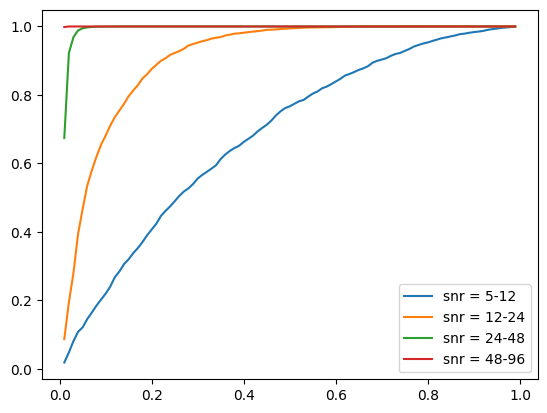

In [35]:
for key in list_roc.keys():
    plt.plot(list_roc[key][0], list_roc[key][1], label = 'snr = {}'.format(key))
    
plt.legend()

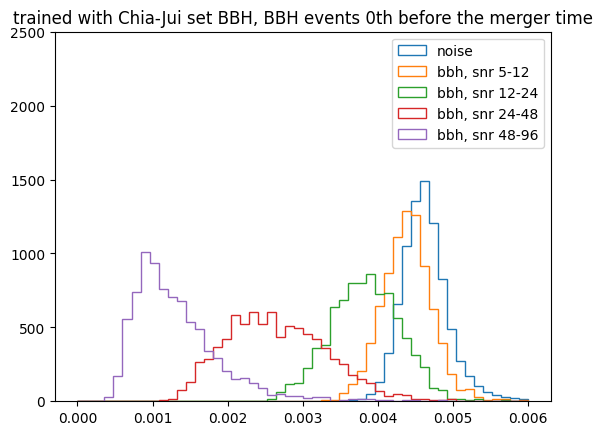

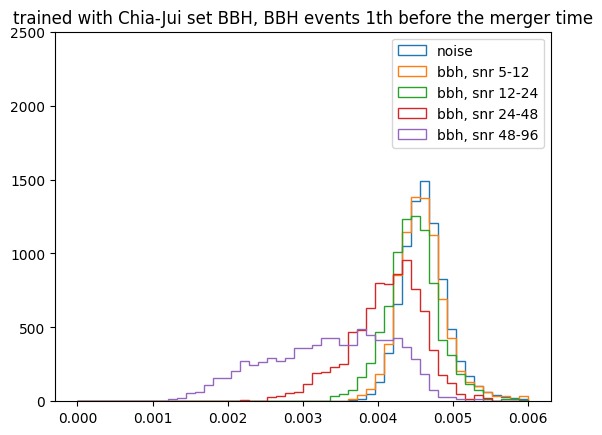

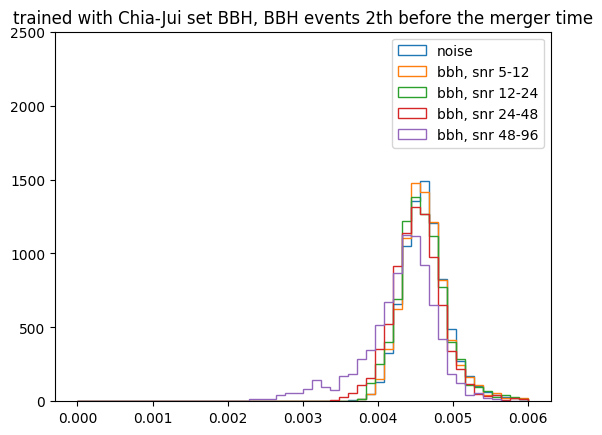

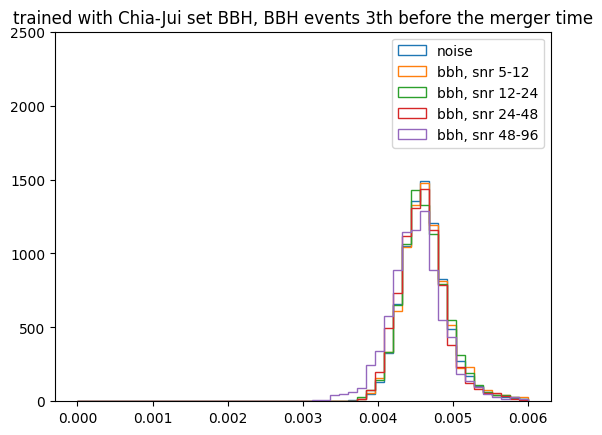

In [120]:
model = ae
idx_list = np.arange(4)
snr_list = ['5-12','12-24','24-48','48-96']

bkg_filtered = realbkg_reserved

for idx in idx_list:
    
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
    dcd_bkg = model(torch.FloatTensor(bkg_filtered)).detach().numpy()
    # dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
    # dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
    # dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

    foo = plt.hist(np.var(bkg_filtered-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="noise")
    # foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
    # foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
    # foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

    for snr in snr_list:
        dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
        foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.006), bins=50, density=True, label="bbh, snr " + snr)

    plt.title("trained with Chia-Jui set BBH, BBH events {}th before the merger time".format(idx))
    # plt.axvline(c0[currentStep], color="k", linestyle="--")
    # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
    plt.ylim(0,2500)
    plt.legend()
    plt.show()

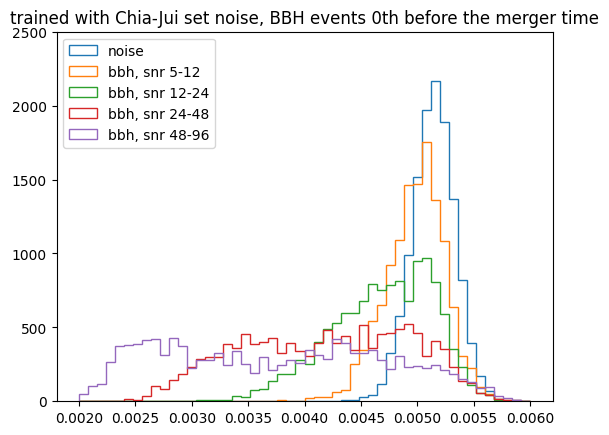

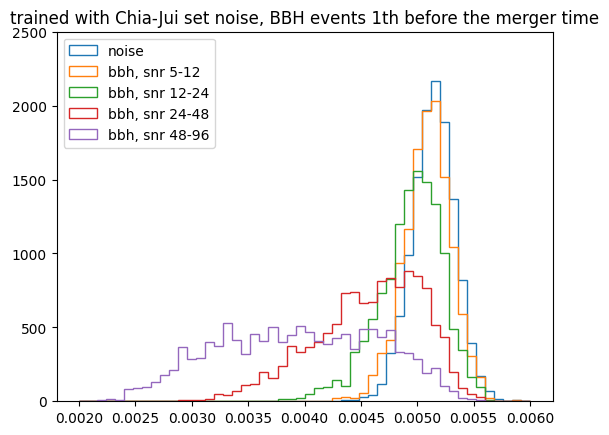

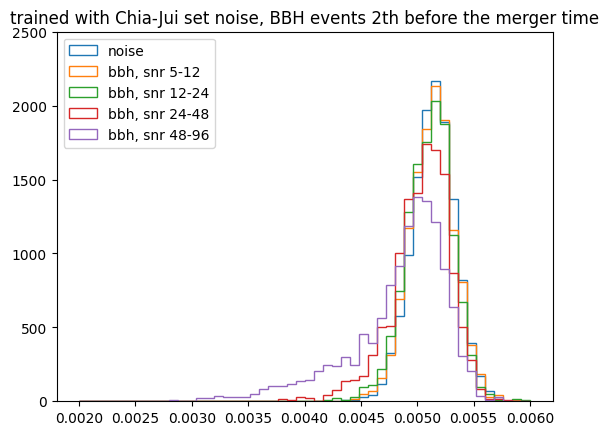

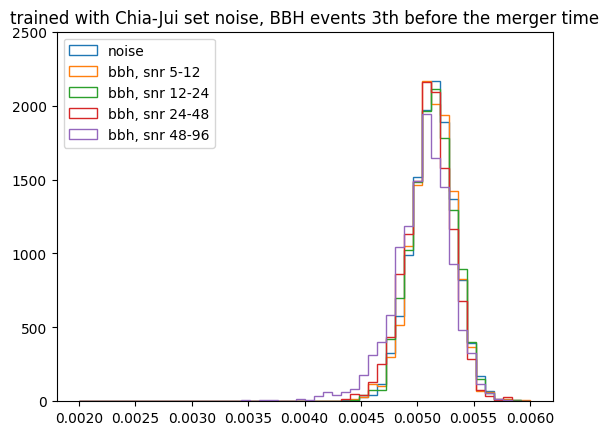

In [263]:
idx_list = np.arange(4)
snr_list = ['5-12','12-24','24-48','48-96']

bkg_filtered = bkg_reserved_list['Chia-Jui']

for idx in idx_list:
    
    for snr_range in snr_list:
    
        realbbh_data = np.load('../Data_cached/injected_BBH_snr'+ snr_range +'_' + str(idx) + 'th_events_before_merger_time.npz')['strain'].reshape(-1,200)
        realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
        
        realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
        realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
        
        realbbh_data = realbbh_data.reshape(-1,400)
        realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
        
        realbbh_list[snr_range] = realbbh_data[:,:200].reshape(-1,1,200)
        
    dcd_bkg = model(torch.FloatTensor(bkg_filtered)).detach().numpy()
    # dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
    # dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
    # dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

    foo = plt.hist(np.var(bkg_filtered-dcd_bkg, axis=2).flatten(), histtype="step", range=(0.002, 0.006), bins=50, density=True, label="noise")
    # foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
    # foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
    # foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

    for snr in snr_list:
        dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
        foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0.002, 0.006), bins=50, density=True, label="bbh, snr " + snr)

    plt.title("trained with Chia-Jui set noise, BBH events {}th before the merger time".format(idx))
    # plt.axvline(c0[currentStep], color="k", linestyle="--")
    # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
    plt.ylim(0,2500)
    plt.legend()
    plt.show()

In [274]:
realbbh_list.keys()

dict_keys(['5-12', '12-24', '24-48', '48-96'])

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_22892\4240661770.py:65: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig1.show()
C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_22892\4240661770.py:66: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig2.show()


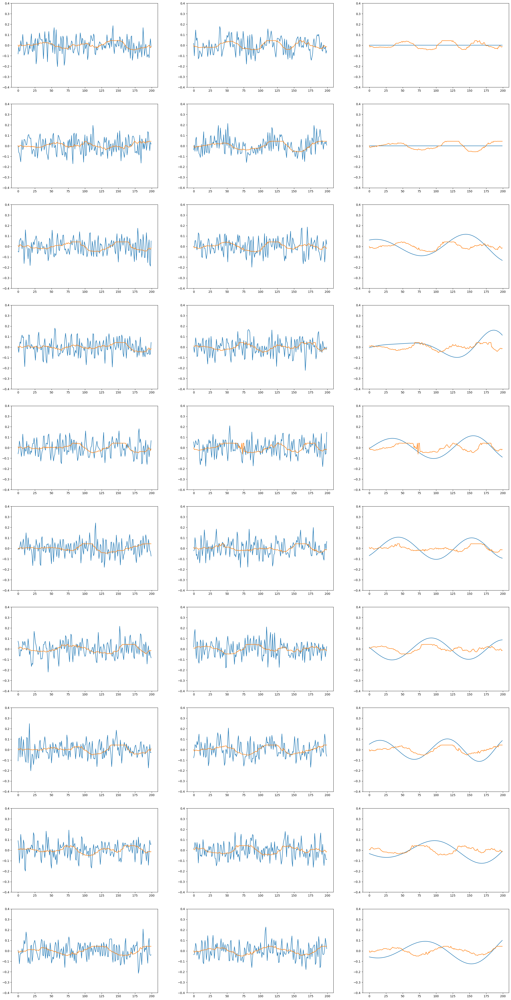

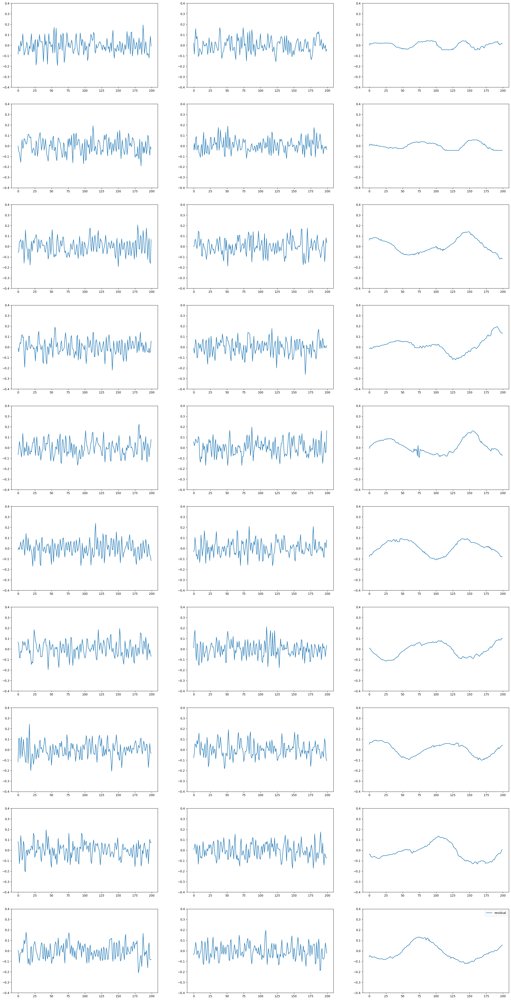

In [276]:
fig1, axes1 = plt.subplots(nrows=10, ncols=3, figsize=(30, 60))
fig2, axes2 = plt.subplots(nrows=10, ncols=3, figsize=(30, 60))
# idx_list = np.array([0])
snr_list = ['GWAK', '5-12','12-24','24-48','48-96']

model_type = ['GWAK']

random_idx = np.random.randint(min(len(realbkg_reserved), min(len(value) for value in realbbh_list.values())), size = (10,2))

for i in range(10):

    data_keys = snr_list[i//2]

    if i < 2:
        noise_data = bkg_reserved_list['GWAK'][[random_idx[i][0]]]

        bbh_data = realbbh_list['GWAK'][[random_idx[i][1]]]

        pure_bbh_data = purebbh_list[data_keys][[random_idx[i][1]]]

    else:
        noise_data = bkg_reserved_list['Chia-Jui'][[random_idx[i][0]]]

        bbh_data = realbbh_list[data_keys][[random_idx[i][1]]]

        pure_bbh_data = purebbh_list[data_keys][[random_idx[i][1]]]

    for j in range(2 * len(models_pic_plot) + 1):
        
        model = models_pic_plot['GWAK']

        if j%3 == 0:
            data = noise_data
        elif j%3 == 1:
            data = bbh_data
        else:
            data = pure_bbh_data

        if i < 2 and j == 3:
            continue
        
        if j != 2:

            dcd = model(torch.FloatTensor(data))[0].detach().numpy()
            # foo = plt.hist(np.var(realbbh_list[snr][:,:101]-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

        axes1[i,j].plot(data.flatten(), label="initial")
        axes1[i,j].plot(dcd.flatten(), label="reconstructed")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes1[i,j].set_ylim(-0.4,0.4)

        axes2[i,j].plot((data-dcd).flatten(), label="residual")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes2[i,j].set_ylim(-0.4,0.4)


plt.legend()

fig1.show()
fig2.show()

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_22892\4240661770.py:65: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig1.show()
C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_22892\4240661770.py:66: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig2.show()


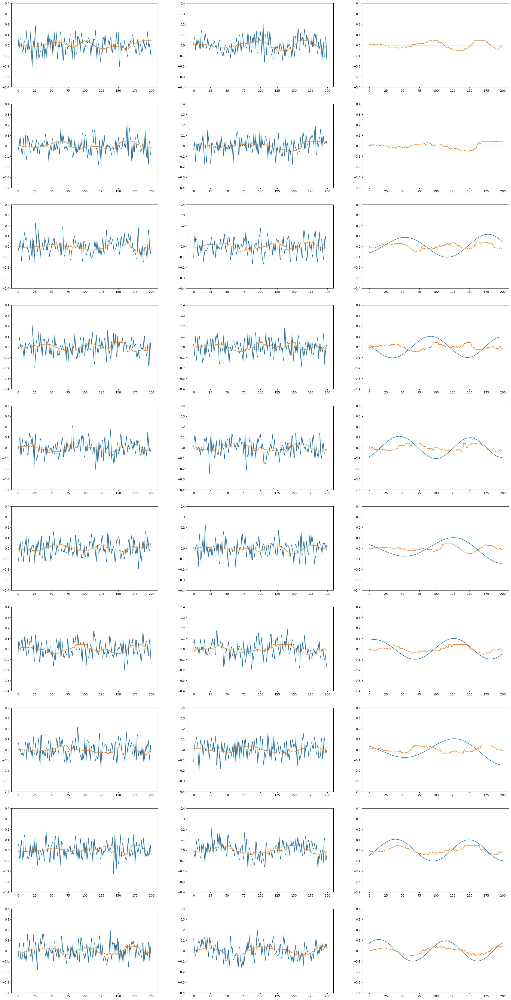

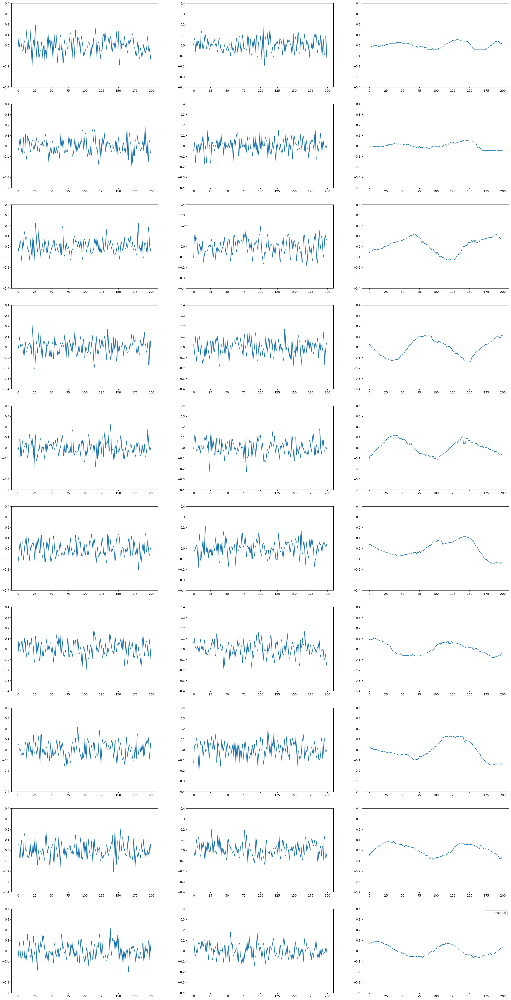

In [240]:
fig1, axes1 = plt.subplots(nrows=10, ncols=3, figsize=(30, 60))
fig2, axes2 = plt.subplots(nrows=10, ncols=3, figsize=(30, 60))
# idx_list = np.array([0])
snr_list = ['GWAK', '5-12','12-24','24-48','48-96']

model_type = ['GWAK']

random_idx = np.random.randint(min(len(realbkg_reserved), min(len(value) for value in realbbh_list.values())), size = (10,2))

for i in range(10):

    data_keys = snr_list[i//2]

    if i < 2:
        noise_data = bkg_reserved_list['GWAK'][[random_idx[i][0]]]

        bbh_data = realbbh_list['GWAK'][[random_idx[i][1]]]

        pure_bbh_data = purebbh_list[data_keys][[random_idx[i][1]]]

    else:
        noise_data = bkg_reserved_list['Chia-Jui'][[random_idx[i][0]]]

        bbh_data = realbbh_list[data_keys][[random_idx[i][1]]]

        pure_bbh_data = purebbh_list[data_keys][[random_idx[i][1]]]

    for j in range(2 * len(models_pic_plot) + 1):
        
        model = models_pic_plot['GWAK']

        if j%3 == 0:
            data = noise_data
        elif j%3 == 1:
            data = bbh_data
        else:
            data = pure_bbh_data

        if i < 2 and j == 3:
            continue
        
        if j != 2:

            dcd = model(torch.FloatTensor(data))[0].detach().numpy()
            # foo = plt.hist(np.var(realbbh_list[snr][:,:101]-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

        axes1[i,j].plot(data.flatten(), label="initial")
        axes1[i,j].plot(dcd.flatten(), label="reconstructed")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes1[i,j].set_ylim(-0.4,0.4)

        axes2[i,j].plot((data-dcd).flatten(), label="residual")

        # plt.title("trained with GWAK set noise, BBH events {}th before the merger time, snr range {}".format(idx, snr))
        # plt.axvline(c0[currentStep], color="k", linestyle="--")
        # plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
        axes2[i,j].set_ylim(-0.4,0.4)


plt.legend()

fig1.show()
fig2.show()

## How about error performance?

GWAK set?

In [266]:
realbbh = np.load("E://GWNMMAD_data/Tw_dataset/Datasets/bbh_for_challenge.npy")[:, 0]
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh = realbbh.reshape(-1,1,200);

In [267]:
realbkg = np.load("E://GWNMMAD_data/Tw_dataset/Datasets/background.npz")['data'][:, 0]

In [268]:
realbkg = realbkg / np.linalg.norm([realbkg], axis = 2).T

realbkg = realbkg.reshape(-1,1,200)

In [269]:
realbkg.shape

(100000, 1, 200)

In [265]:
model

WaveletCNNAE_xc(
  (cap_norm): GroupNorm(1, 1, eps=1e-05, affine=True)
  (Conv_In_encode): Conv1d(1, 4, kernel_size=(1,), stride=(1,))
  (Conv_Out_encode): Conv1d(4, 1, kernel_size=(1,), stride=(1,))
  (Conv_In_decode): Conv1d(1, 4, kernel_size=(1,), stride=(1,))
  (Conv_Out_decode): Conv1d(4, 1, kernel_size=(1,), stride=(1,))
  (body_norm_encode): GroupNorm(4, 4, eps=1e-05, affine=True)
  (body_norm_decode): GroupNorm(4, 4, eps=1e-05, affine=True)
  (end_norm_encode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (end_norm_decode): BatchNorm1d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (WaveNet_layers_encode): ModuleList(
    (0): Conv1d(4, 4, kernel_size=(2,), stride=(1,))
    (1): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(2,))
    (2): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(4,))
    (3): Conv1d(4, 4, kernel_size=(2,), stride=(1,), dilation=(8,))
    (4): Conv1d(4, 4, kernel_size=(2,), stride=(1,)

In [270]:
dcd_bkg = model(torch.FloatTensor(realbkg)).detach().numpy()
dcd_bbh = model(torch.FloatTensor(realbbh)).detach().numpy()

In [70]:
dcd_bkg = ae(torch.FloatTensor(realbkg)).detach().numpy()
dcd_bbh = ae(torch.FloatTensor(realbbh)).detach().numpy()

In [47]:
dcd_bkg = autoencoder(ae(torch.FloatTensor(realbkg)))[1].detach().numpy()
dcd_bbh = autoencoder(ae(torch.FloatTensor(realbbh)))[1].detach().numpy()

Text(0.5, 1.0, 'Error distribution for reconstruction, with CNN_pooling_DNN after CNN, bottleneck=10 - GWAK set')

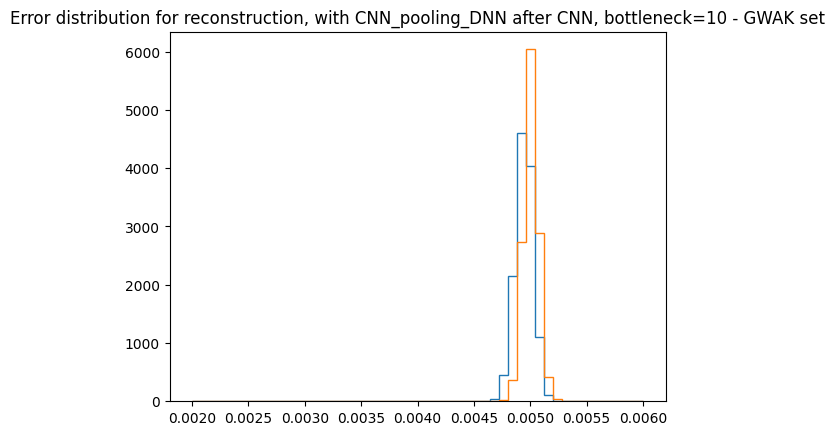

In [48]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction, with CNN_pooling_DNN after CNN, bottleneck=10 - GWAK set')

Text(0.5, 1.0, 'Error distribution for reconstruction, with DNN after CNN, bottleneck=5 - GWAK set')

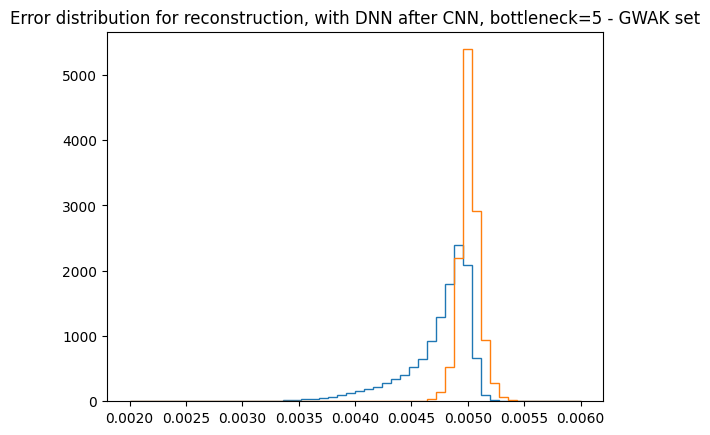

In [128]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction, with DNN after CNN, bottleneck=5 - GWAK set')

Text(0.5, 1.0, 'Error distribution for reconstruction - GWAK set')

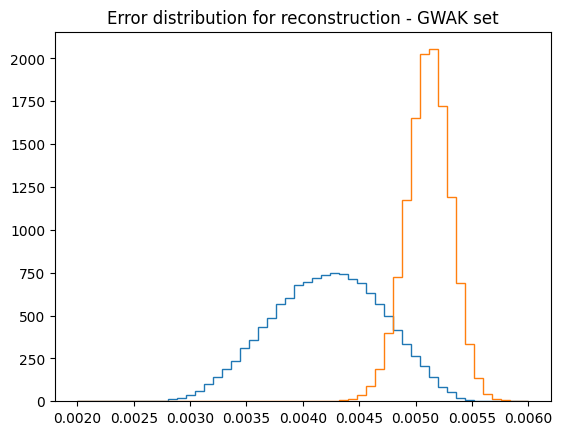

In [272]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction - GWAK set')

Text(0.5, 1.0, 'Error distribution for reconstruction, with DNN after CNN, bottleneck=10 - GWAK set')

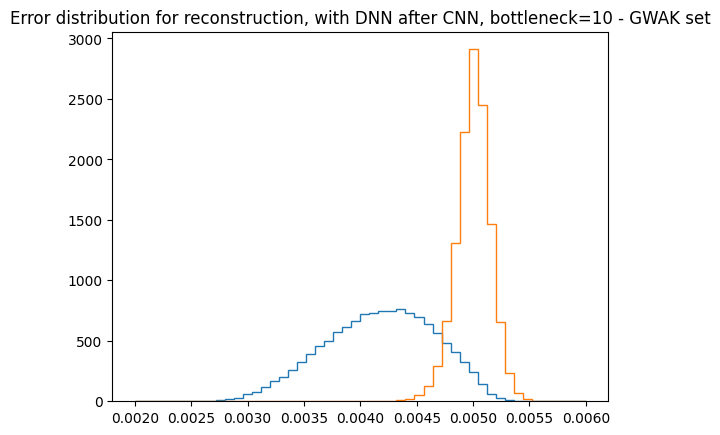

In [120]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction, with DNN after CNN, bottleneck=10 - GWAK set')

Text(0.5, 1.0, 'Error distribution for reconstruction, with DNN after CNN - GWAK set')

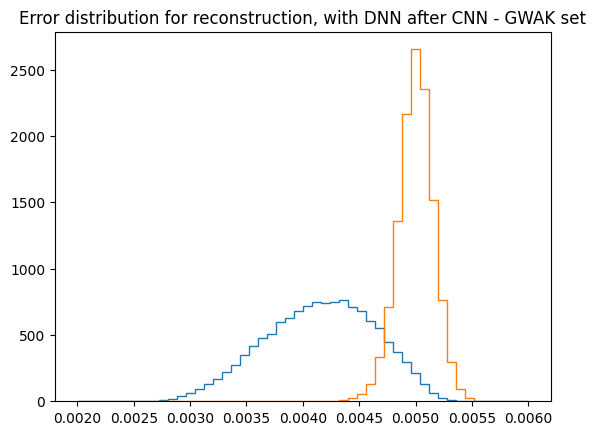

In [103]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction, with DNN after CNN - GWAK set')

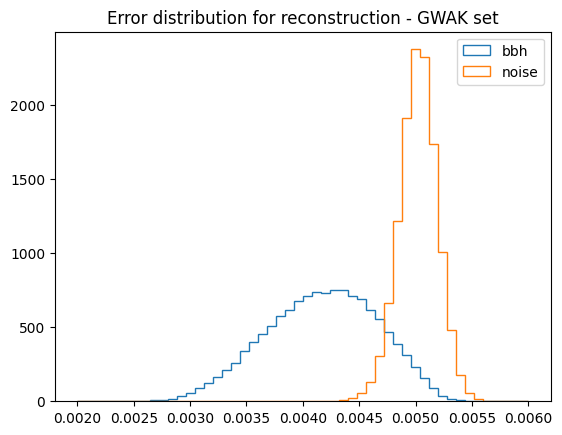

In [72]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step', label = 'bbh')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step',  label = 'noise')

plt.title('Error distribution for reconstruction - GWAK set')
plt.legend()

Text(0.5, 1.0, 'Error distribution for reconstruction - GWAK set')

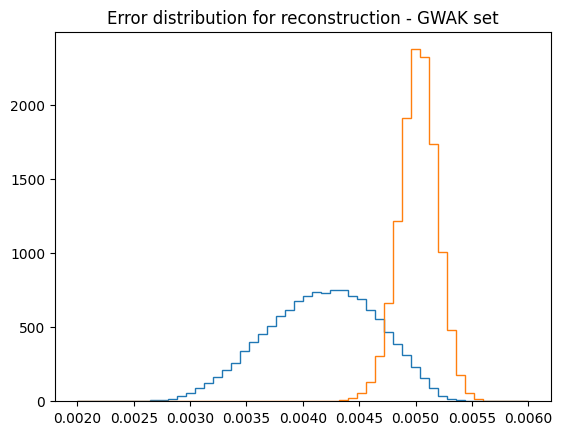

In [43]:
plt.hist(np.var(realbbh - dcd_bbh, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')
plt.hist(np.var(realbkg - dcd_bkg, axis = 2).flatten(), range = (0.002, 0.006), bins= 50, density = True, histtype='step')

plt.title('Error distribution for reconstruction - GWAK set')

In [55]:
dcd_bbh.shape

(80000, 1, 200)

In [56]:
np.linalg.norm(dcd_bbh, axis = 2).shape

(80000, 1)

Text(0.5, 1.0, 'Norm distribution for reconstruction - GWAK set')

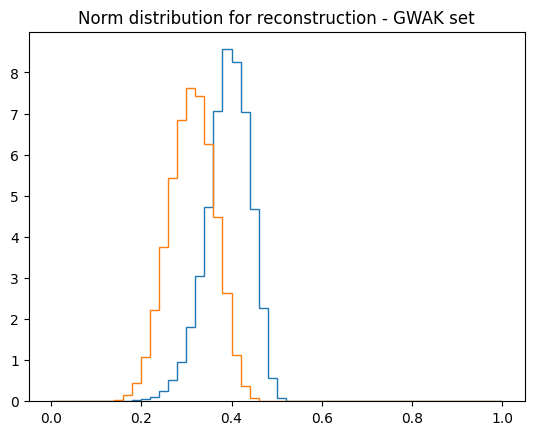

In [58]:
norm_bbh = np.linalg.norm(dcd_bbh, axis = 2).flatten()
norm_bkg = np.linalg.norm(dcd_bkg, axis = 2).flatten()


plt.hist(norm_bbh, range = (0, 1), bins= 50, density = True, histtype='step', label = 'bkg')
plt.hist(norm_bkg, range = (0, 1), bins= 50, density = True, histtype='step', label = 'bbh')

plt.title('Norm distribution for reconstruction - GWAK set')

Chia-Jui set?

In [254]:
realbbh = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['strain'][:, 0]
realbbh_snr = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['snr']
perm = np.random.permutation(len(realbbh))
realbbh = realbbh / np.linalg.norm([realbbh], axis=2).T
realbbh = realbbh[perm]
realbbh_snr = realbbh_snr[perm]
realbbh = realbbh.reshape(-1,1,200);

In [255]:
realbkg_L = np.load("../Data_cached/real_bkg_2202000_63917s_4000Hz_50ms.npy")[:100000]
# realbbh_snr = np.load("../Data_cached/injected_BBH_1823_around_merger_time_63917_58803.npz")['snr']
# perm = np.random.permutation(len(realbbh))
realbkg_L = realbkg_L / np.linalg.norm([realbkg_L], axis=2).T
# realbbh = realbbh[perm]
# realbbh_snr = realbbh_snr[perm]
realbkg_L = realbkg_L.reshape(-1,1,200);

In [47]:
snr_range = [[5,12],[12,24],[24,48],[48,96]]
realbbh_list = {}
for i in range(4):
    realbbh_list["-".join([str(snr_range[i][0]),str(snr_range[i][1])])] = realbbh[np.argwhere(np.logical_and(realbbh_snr > snr_range[i][0], realbbh_snr <= snr_range[i][1])).flatten()]

In [256]:
snr_list = ['5-12','12-24','24-48','48-96']

realbbh_list = {}

for snr_range in snr_list:
    
    realbbh_data = np.load('../Data_cached/injected_BBH_snr' + snr_range + '.npz')['strain'][:, 0]
    realbbh_data = realbbh_data / np.linalg.norm([realbbh_data], axis=2).T
    
    # realbbh_data_fft = abs(np.fft.rfft(realbbh_data))
    # realbbh_data_fft = realbbh_data_fft / np.linalg.norm([realbbh_data_fft], axis=2).T
    
    # realbbh_data_fft = realbbh_data_fft.reshape(-1,202)
    
    realbbh_list[snr_range] = realbbh_data.reshape(-1,1,200)
    

In [257]:
realbbh_list['12-24'].shape

(1913, 1, 200)

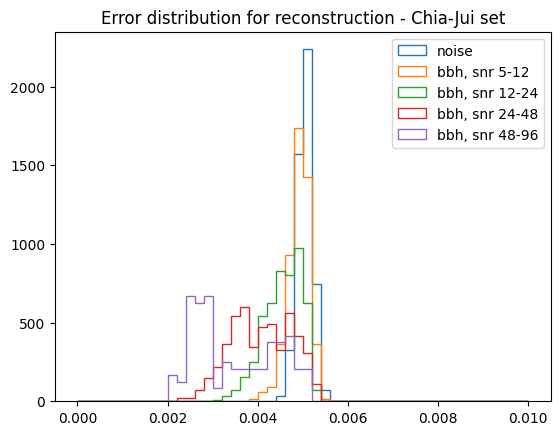

In [51]:
model = ae

# c0[currentStep] = 0.002;

dcd_bkg = model(torch.FloatTensor(realbkg_L)).detach().numpy()
# dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
# dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
# dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

foo = plt.hist(np.var(realbkg_L-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="noise")
# foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
# foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
# foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

for snr in realbbh_list.keys():
    dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
    foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

plt.title('Error distribution for reconstruction - Chia-Jui set')
# plt.axvline(c0[currentStep], color="k", linestyle="--")
# plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
# plt.ylim(0,2000)
plt.legend()

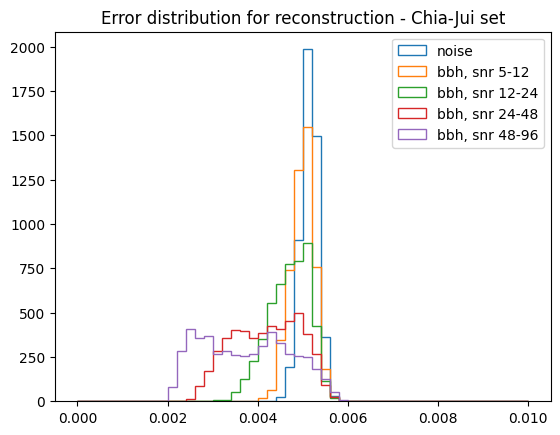

In [258]:
# model = ae

# c0[currentStep] = 0.002;

dcd_bkg = model(torch.FloatTensor(realbkg_L)).detach().numpy()
# dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
# dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
# dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

foo = plt.hist(np.var(realbkg_L-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="noise")
# foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
# foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
# foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

for snr in realbbh_list.keys():
    dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
    foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

plt.title('Error distribution for reconstruction - Chia-Jui set')
# plt.axvline(c0[currentStep], color="k", linestyle="--")
# plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
# plt.ylim(0,2000)
plt.legend()

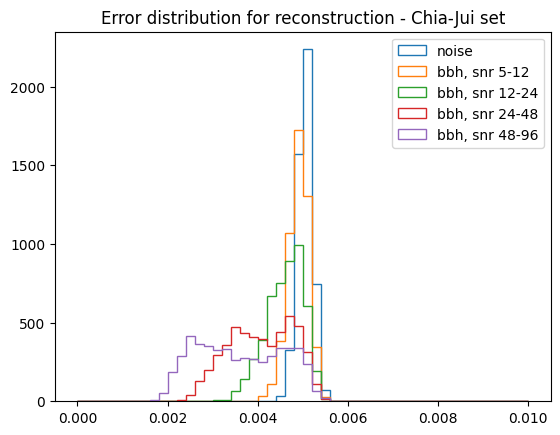

In [80]:
model = ae

# c0[currentStep] = 0.002;

dcd_bkg = model(torch.FloatTensor(realbkg_L)).detach().numpy()
# dcd_bbh = model(torch.FloatTensor(bbh_filtered))[1].detach().numpy()
# dcd_sg = model(torch.FloatTensor(sg_filtered))[1].detach().numpy()
# dcd_glitch = model(torch.FloatTensor(glitch_fft))[1].detach().numpy()

foo = plt.hist(np.var(realbkg_L-dcd_bkg, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="noise")
# foo = plt.hist(np.var(bbh_filtered-dcd_bbh, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh")
# foo = plt.hist(np.var(sg_filtered-dcd_sg, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="sg")
# foo = plt.hist(np.var(glitch_fft-dcd_glitch, axis=1), histtype="step", range=(0, 0.01), bins=50, density=True, label="glitch")

for snr in realbbh_list.keys():
    dcd_bbh = model(torch.FloatTensor(realbbh_list[snr])).detach().numpy()
    foo = plt.hist(np.var(realbbh_list[snr]-dcd_bbh, axis=2).flatten(), histtype="step", range=(0, 0.01), bins=50, density=True, label="bbh, snr " + snr)

plt.title('Error distribution for reconstruction - Chia-Jui set')
# plt.axvline(c0[currentStep], color="k", linestyle="--")
# plt.axvline(np.sort(np.var(bbh_filtered-dcd_bbh, axis=1))[int(0.1 * len(bbh_filtered))], color = 'k', linestyle = '--')
# plt.ylim(0,2000)
plt.legend()

Text(0.5, 1.0, 'Norm distribution for reconstruction')

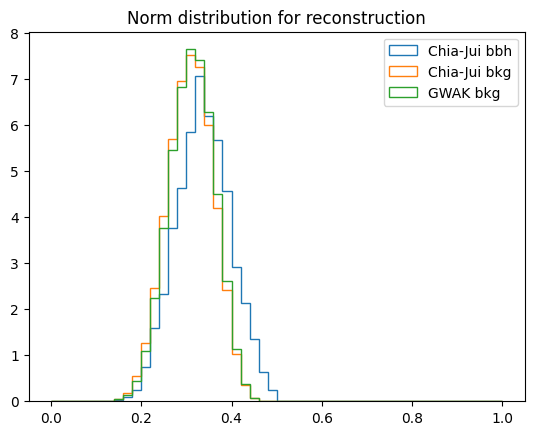

In [64]:
dcd_bkg = ae(torch.FloatTensor(realbkg_L)).detach().numpy()
dcd_bbh = ae(torch.FloatTensor(realbbh)).detach().numpy()
dcd_bkg_GWAK = ae(torch.FloatTensor(realbkg)).detach().numpy()

norm_bbh = np.linalg.norm(dcd_bbh, axis = 2).flatten()
norm_bkg = np.linalg.norm(dcd_bkg, axis = 2).flatten()
norm_bkg_GWAK = np.linalg.norm(dcd_bkg_GWAK, axis = 2).flatten()


plt.hist(norm_bbh, range = (0, 1), bins= 50, density = True, histtype='step', label = 'Chia-Jui bbh')
plt.hist(norm_bkg, range = (0, 1), bins= 50, density = True, histtype='step', label = 'Chia-Jui bkg')
plt.hist(norm_bkg_GWAK, range = (0, 1), bins= 50, density = True, histtype='step', label = 'GWAK bkg')
plt.legend()

plt.title('Norm distribution for reconstruction')